In [249]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy import optimize
import matplotlib.ticker as mtick
import matplotlib.dates as mdates
import urllib.request, json 
import seaborn as sns

In [496]:
date = '_4_26'

# JHU data

## Regular watch list

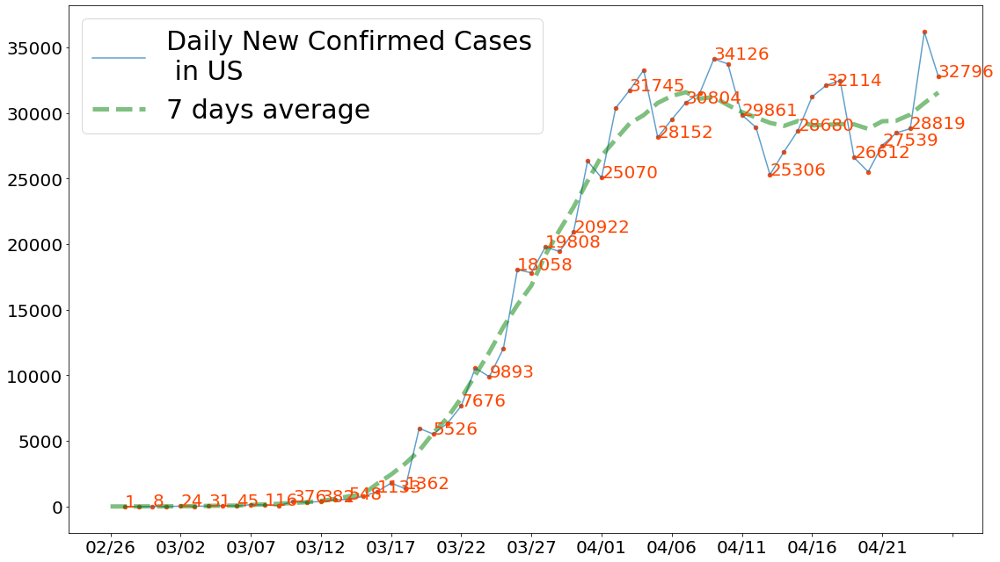

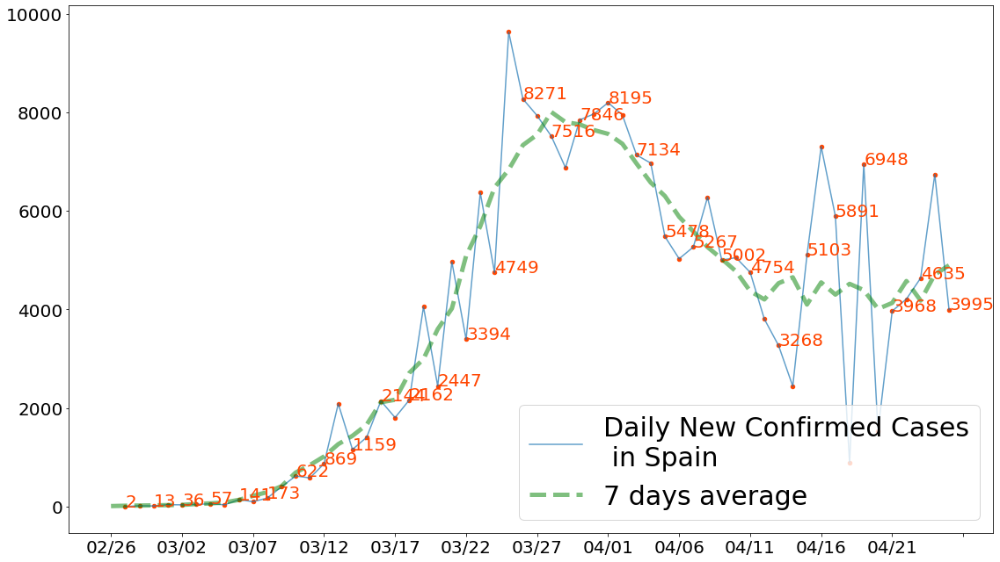

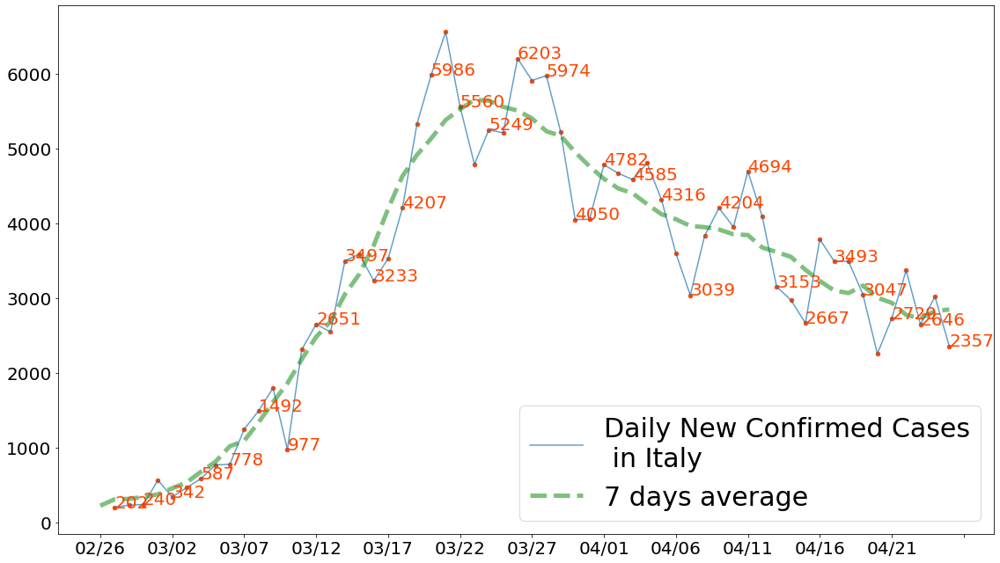

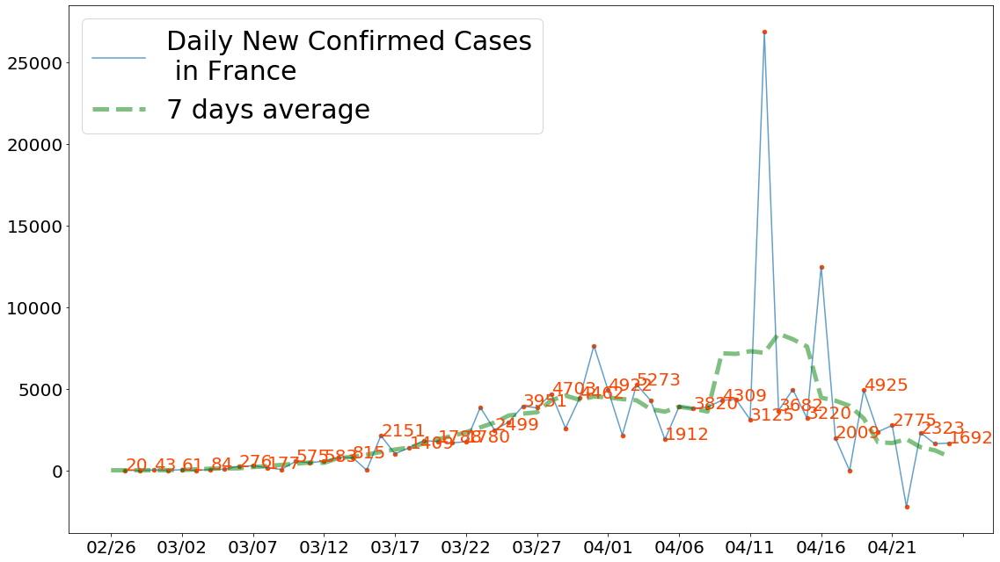

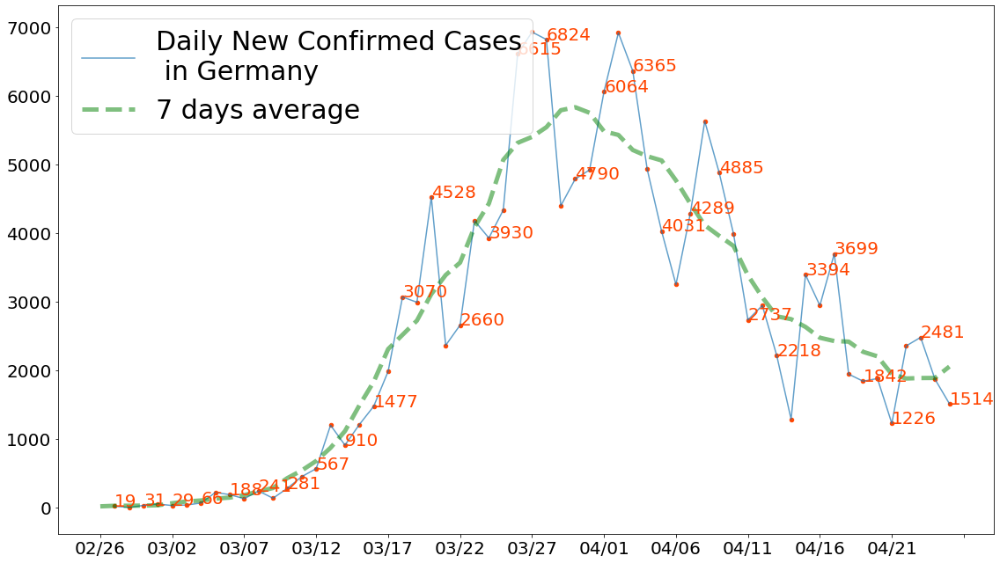

...

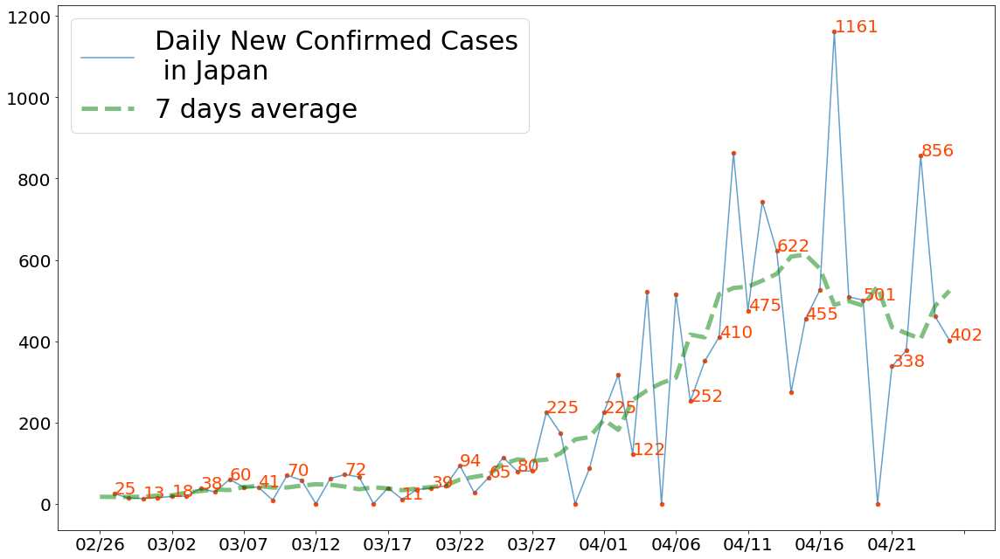

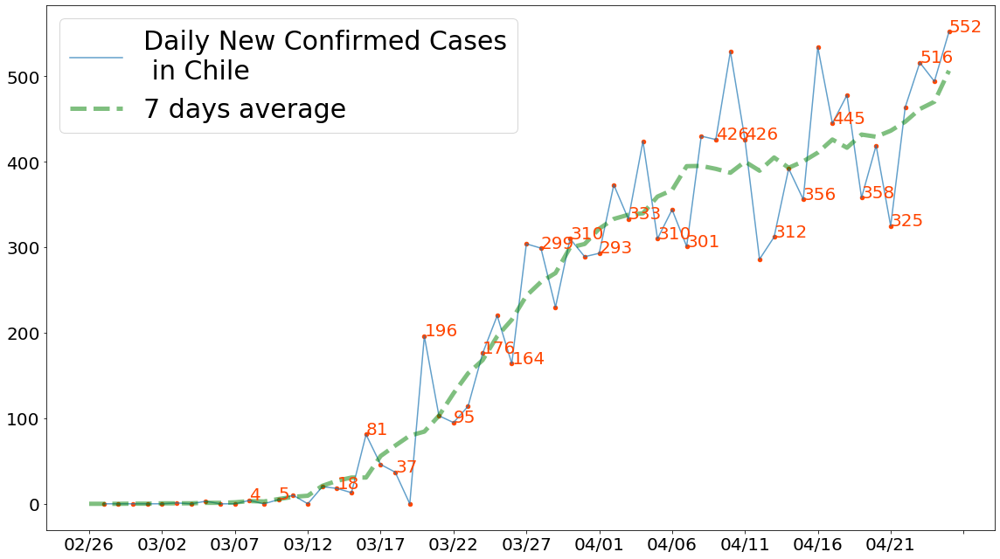

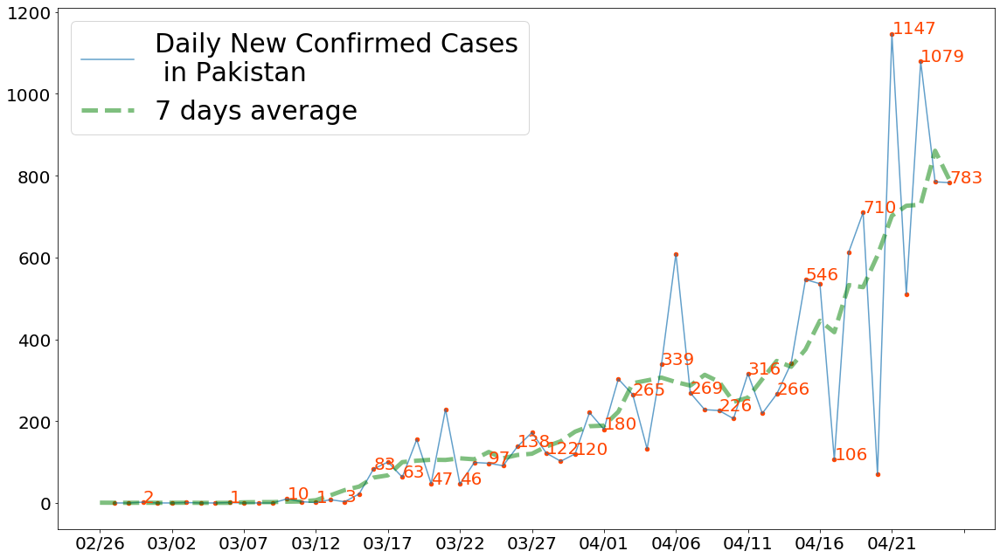

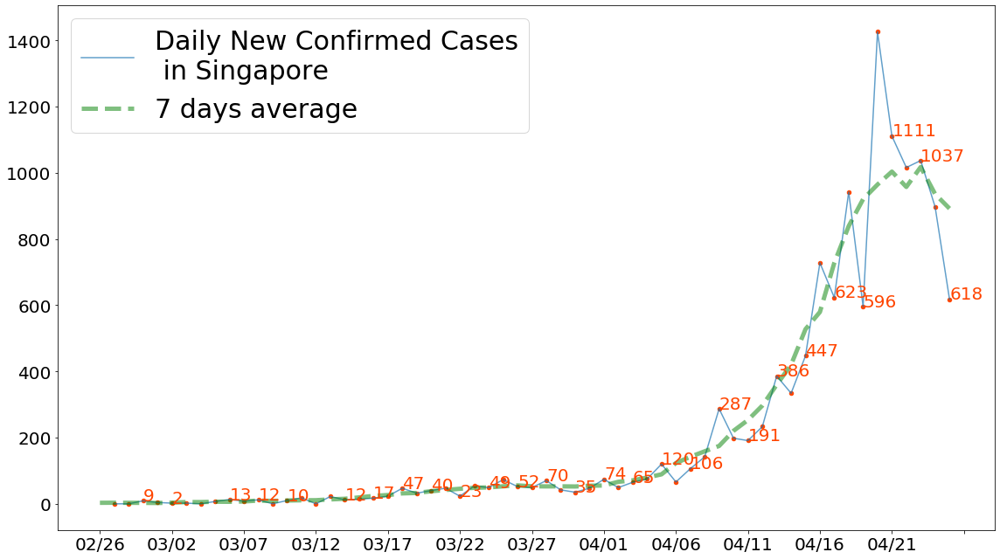

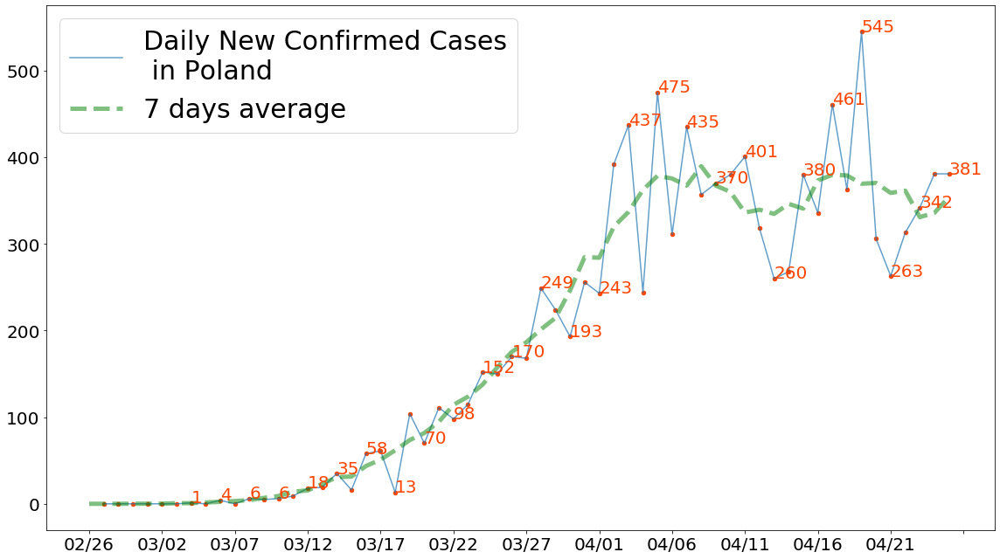

In [461]:
confirm = pd.read_csv('data/JH/confirm_agg.csv').set_index('Country/Region').T
confirm['time'] = pd.to_datetime(confirm.index)
confirm.index = confirm.time.dt.strftime('%m/%d')
confirm.drop('time', axis=1, inplace=True)

offset = 35
for country in confirm.iloc[-1].sort_values(ascending=False).index[:30]:
    focus =  confirm.loc[:,[country]].copy()[offset:]
    focus['new'] = focus[country] - focus[country].shift(1)
    
    fig, ax=plt.subplots(nrows=1, ncols=1, figsize=(16,9))
    ax.plot(focus.index, focus.new, label='Daily New Confirmed Cases\n in ' + country, alpha=0.7)
    ax.scatter(focus.index, focus.new, c='orangered',s=20, label='')

    window = 7
    focus['average'] = focus['new'].rolling(window=window, min_periods=1, center=True).mean()
    ax.plot(focus.index, focus.average, 'g--', lw=5, alpha=0.5, label='%d days average'%window)
    
    for i, v in enumerate(focus.new):
        if v > 0 and (i%2) != (len(focus.index)%2):
            ax.text(i, v+0.3, str(int(v)), color='orangered', fontsize=20)

    # ax.set_yscale('log')
    ax.tick_params(labelsize=20)
    ax.legend(fontsize=30)

    plt.tight_layout()
    ax.xaxis.set_major_locator(plt.MaxNLocator(15))
#     plt.savefig(r'figures/%s.png'% (country+date), dpi=600)
    plt.show()

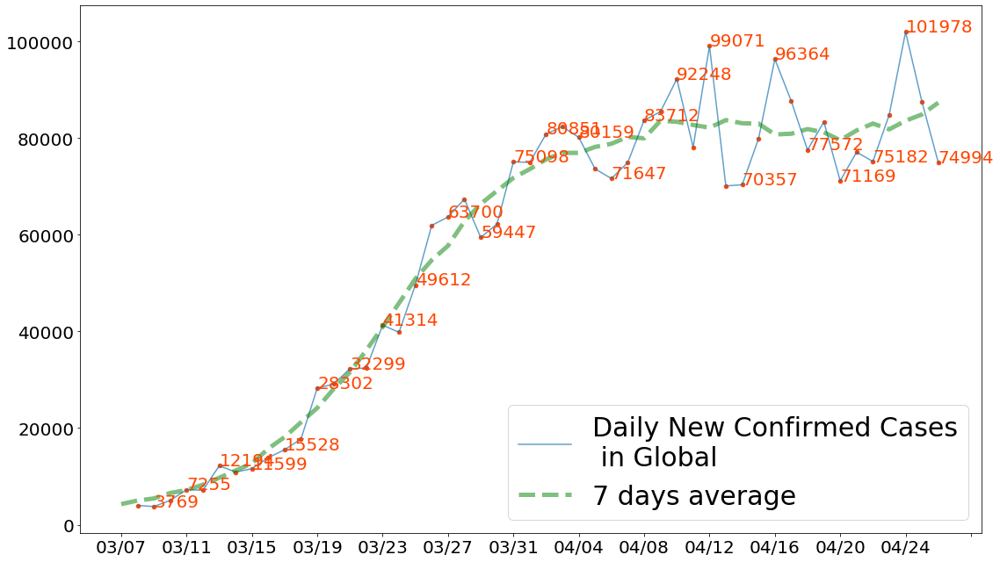

In [515]:
offset = 45
country = 'Turkey'

confirm = pd.read_csv('data/JH/confirm_agg.csv').set_index('Country/Region').T
confirm['time'] = pd.to_datetime(confirm.index)
confirm.index = confirm.time.dt.strftime('%m/%d')

confirm['Global'] = confirm.sum(axis=1)

focus =  confirm.loc[:,[country]].copy()[offset:]
focus['new'] = focus[country] - focus[country].shift(1)

fig, ax=plt.subplots(nrows=1, ncols=1, figsize=(16,9))
ax.plot(focus.index, focus.new, label='Daily New Confirmed Cases\n in ' + country, alpha=0.7)
ax.scatter(focus.index, focus.new, c='orangered',s=20, label='')

# average
window = 7
focus['average'] = focus['new'].rolling(window=window, min_periods=1, center=True).mean()
ax.plot(focus.index, focus.average, 'g--', lw=5, alpha=0.5, label='%d days average'%window)

for i, v in enumerate(focus.new):
    if v > 0 and v not in [5974,4050,5210,4668,3590,6549,3836,3951,3148,19444,4056,32829,29595,5267,7967,6969,5051,
                          7846,7947,6824,4790,29861,17821,5526,432,323,1119,1175,582,270,196,163,1178,1028,1289,1617,
                          1991,2926,1192,958,591,4062,28680,31451,3388,31905,30838,6327,] and (len(focus.new)-i)%2 != 0:
        ax.text(focus.index[i], v+0.3, str(int(v)), color='orangered', fontsize=20)

ax.tick_params(labelsize=20)
ax.legend(loc=0, fontsize=30)

plt.tight_layout()
ax.xaxis.set_major_locator(plt.MaxNLocator(15))
ax.format_xdata = mdates.DateFormatter('%m-%d')

plt.savefig(r'figures/Daily_dynamics_%s.png'% (country+date), dpi=600)

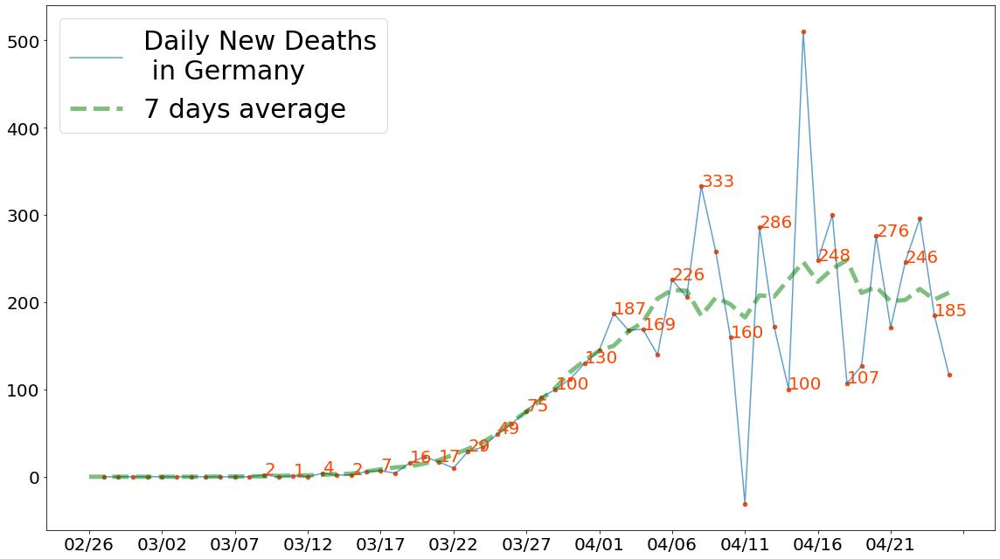

In [472]:
offset = 35
country = 'Germany'


confirm = pd.read_csv('data/JH/death_agg.csv').set_index('Country/Region').T
confirm['time'] = pd.to_datetime(confirm.index)
confirm.index = confirm.time.dt.strftime('%m/%d')

focus =  confirm.loc[:,[country]].copy()[offset:]
focus['new'] = focus[country] - focus[country].shift(1)

fig, ax=plt.subplots(nrows=1, ncols=1, figsize=(16,9))
ax.plot(focus.index, focus.new, label='Daily New Deaths\n in ' + country, alpha=0.7)
ax.scatter(focus.index, focus.new, c='orangered',s=20, label='')

# average
window = 7
focus['average'] = focus['new'].rolling(window=window, min_periods=1, center=True).mean()
ax.plot(focus.index, focus.average, 'g--', lw=5, alpha=0.5, label='%d days average'%window)

for i, v in enumerate(focus.new):
    if v > 0 and v not in [5974,4050,5210,4668,3590,6549,3836,3951,3148,19444,4056,32829,29595,5267,7967,6969,5051,
                          7846,7947,6824,4790,29861,17821,5526,432,323,1119,1175,582,270,196,163,1178,1028,1289,1617,
                          1991,2926,1192,958,591,4062]and i % 2 ==0:
        ax.text(focus.index[i], v+0.3, str(int(v)), color='orangered', fontsize=20)

# ax.set_yscale('log')
ax.tick_params(labelsize=20)
ax.legend(loc=0, fontsize=30)

plt.tight_layout()
ax.xaxis.set_major_locator(plt.MaxNLocator(15))
ax.format_xdata = mdates.DateFormatter('%m-%d')

plt.savefig(r'figures/Daily_dynamics_death_%s.png'% (country+date+'_death'), dpi=600)

## Segmented Regression

In [142]:
def linear_fit(x, a, b):
    return  a*x+b

def country_dynamics(category, country, cut, days):
    fig, ax = plt.subplots(nrows=1, ncols=1, sharey=True, figsize=(16,9))
    ax.set_yscale('log')
    cum = data[category].copy().T[[country]]
    cum['time'] = pd.to_datetime(cum.index)
    cum.index = cum.time.dt.strftime('%m/%d')
    cum.drop('time', axis=1, inplace=True)
    
    focus = (cum - cum.shift(1)).iloc[cut:,:]
    
    ax.plot(cum.iloc[cut:,:], alpha=0.8, lw=2, label=category + ' cases in ' + country )
    ax.scatter(focus.index, focus[country], c='gray', s=5)
    
    for i,(a,b) in enumerate(days):
        slope, intercept = optimize.curve_fit(linear_fit, np.arange(a,b), np.log(focus[country].values[a:b]+1))[0]
        ax.plot(np.arange(a,b), np.exp(np.arange(a,b)*slope + intercept), c=('C'+str(i+1)))
        ax.annotate(np.round(np.exp(slope),2), 
                    xy=((a+b-2)/2, np.exp((a+b+2)/2*slope + intercept)), fontsize=24, c=('C'+str(i+1)))                    
            
    ax.legend(prop={'size': 30})
    ax.tick_params(labelsize=20)
    ax.xaxis.set_major_locator(plt.MaxNLocator(12))
    ax.format_xdata = mdates.DateFormatter('%m-%d')
    plt.tight_layout()

def country_dynamics_all(country, cut, days):
    fig, ax = plt.subplots(nrows=3, ncols=1, sharex=True, figsize=(12,12))
    fig.subplots_adjust(wspace=0, hspace=0)
    
    for i,category in enumerate(data.keys()):
        ax[i].set_yscale('log')
        cum = data[category].copy().T[[country]]
        focus = (cum - cum.shift(1)).iloc[cut:,:]

        ax[i].plot(cum.iloc[cut:,:], alpha=0.5, lw=2, label=category + ' cases in ' + country )
        ax[i].scatter(focus.index, focus[country], c='gray', s=5)

        for j,(a,b) in enumerate(days[i]):
            slope, intercept = optimize.curve_fit(linear_fit, np.arange(a,b), np.log(focus[country].values[a:b]+1))[0]
            ax[i].plot(np.arange(a,b), np.exp(np.arange(a,b)*slope + intercept), c=('C'+str(j+1)))
            ax[i].annotate(np.round(np.exp(slope),2), 
                    xy=((a+b-2)/2, np.exp((a+b)/2*slope + intercept)), fontsize=14, c=('C'+str(j+1)))  

        ax[i].legend(prop={'size': 12})
        ax[i].tick_params(labelrotation=90, labelsize=14)
        # ax.xaxis.set_major_locator(plt.MaxNLocator(15))
        plt.tight_layout()
        
def country_dynamics_all_in_one(country, cut, days):
    fig, ax = plt.subplots(nrows=1, ncols=1, sharex=True, figsize=(12,10))
    fig.subplots_adjust(wspace=0, hspace=0)
    
    for i,category in enumerate(data.keys()):
        ax.set_yscale('log')
        focus = (cum - cum.shift(1)).iloc[cut:,:]

#         ax.plot(cum.iloc[cut:,:], alpha=0.5, lw=2, label=category + ' cases in ' + country )
        ax.scatter(focus.index, focus[country], c='gray', s=5)

        for j,(a,b) in enumerate(days[i]):
            slope, intercept = optimize.curve_fit(linear_fit, np.arange(a,b), np.log(focus[country].values[a:b]+1))[0]
            ax[i].plot(np.arange(a,b), np.exp(np.arange(a,b)*slope + intercept), c=('C'+str(j+1)))
            ax[i].annotate(np.round(np.exp(slope),2), 
                    xy=((a+b-2)/2, np.exp((a+b)/2*slope + intercept)), fontsize=14, c=('C'+str(j+1)))  

        ax[i].legend(prop={'size': 12})
        ax[i].tick_params(labelrotation=90, labelsize=14)
        # ax.xaxis.set_major_locator(plt.MaxNLocator(15))
        plt.tight_layout()


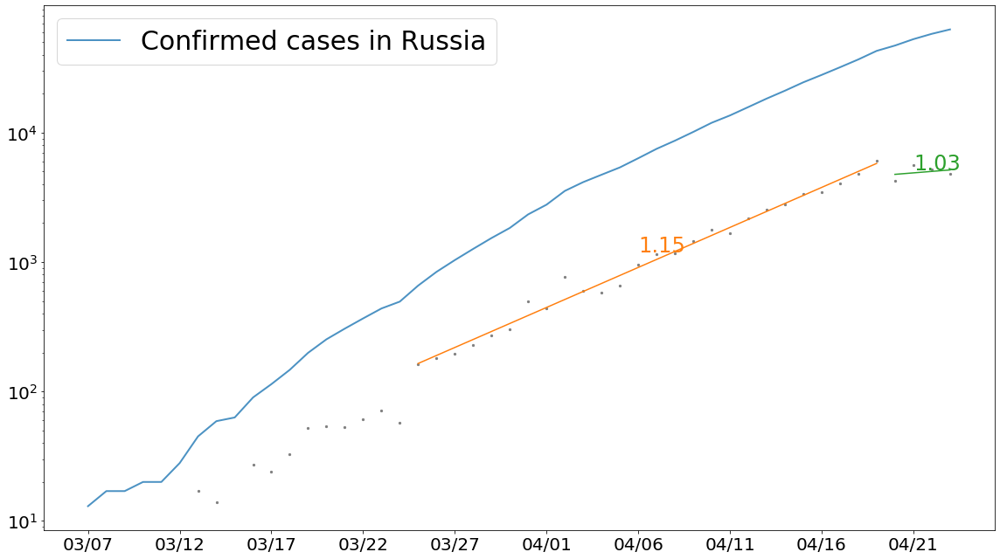

In [342]:
confirm = pd.read_csv('data/JH/confirm_agg.csv').set_index('Country/Region')
death = pd.read_csv('data/JH/death_agg.csv').set_index('Country/Region')
recover = pd.read_csv('data/JH/recover_agg.csv').set_index('Country/Region')
data = {'Confirmed':confirm, 'Death':death, 'Recovered':recover}

# country_dynamics('Confirmed', 'Australia',40, [(7,20),(21,30),(30,36)])
# country_dynamics('Confirmed', 'Austria',35, [(7,16),(16,28),(29,42)])
# country_dynamics('Confirmed', 'Brazil',28, [(3,14),(16,30),(31,38),(39,56)])
# country_dynamics('Confirmed', 'China',0, [(1,8),(8,14),(14,28),(29,45)])
# country_dynamics('Confirmed', 'Germany',35, [(2,24),(24,32),(32,39)])

# country_dynamics('Confirmed', 'Iran',28, [(3,14),(16,30),(31,38),(39,56)])
# country_dynamics('Confirmed', 'Israel',40, [(9,28),(29,36)])
# country_dynamics('Confirmed', 'Italy',30, [(1,8),(8,18),(19,30),(29,61)])
# country_dynamics('Confirmed', 'Norway',35, [(2,20),(24,32),(32,39)])

country_dynamics('Confirmed', 'Russia',45, [(18,44),(44,48)])
# country_dynamics('Confirmed', 'Spain',35, [(2,16),(17,28),(28,44)])
# country_dynamics('Confirmed', 'Switzerland',35, [(2,15),(22,42),(42,45)])

# country_dynamics('Confirmed', 'Turkey',50, [(4,11),(11,16),(16,31),(30,36)])
# country_dynamics('Confirmed', 'United Kingdom',35, [(5,31),(31,44)])
# country_dynamics('Confirmed', 'US',35,  [(2,14),(14,27),(27,39),(39,45)])

plt.savefig(r'figures/Trend_Russia_%s.png'%date, dpi=600)

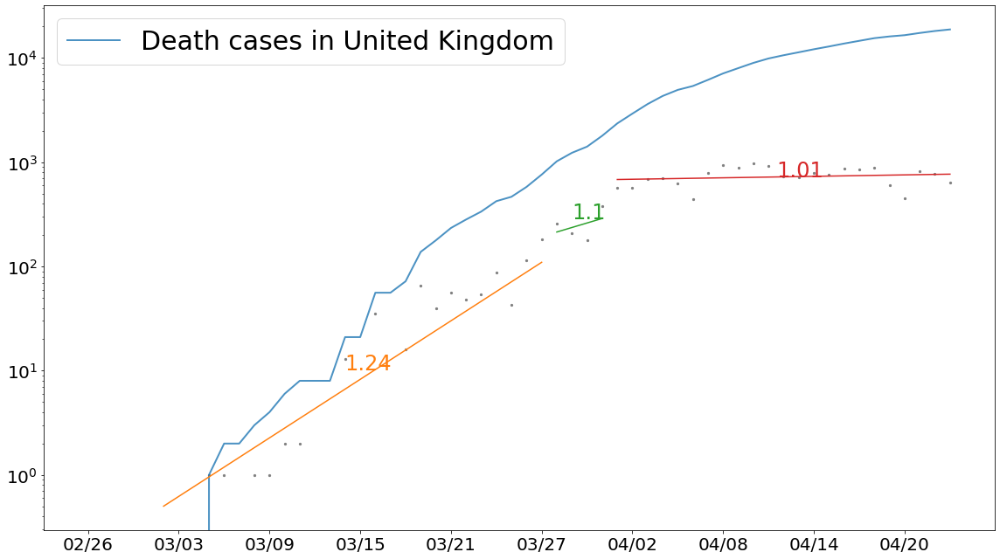

In [343]:
confirm = pd.read_csv('data/JH/confirm_agg.csv').set_index('Country/Region')
death = pd.read_csv('data/JH/death_agg.csv').set_index('Country/Region')
recover = pd.read_csv('data/JH/recover_agg.csv').set_index('Country/Region')
data = {'Confirmed':confirm, 'Death':death, 'Recovered':recover}

# country_dynamics('Death', 'Australia',40, [(7,20),(21,30),(30,36)])
# country_dynamics('Death', 'Austria',35, [(7,16),(16,28),(29,42)])
# country_dynamics('Death', 'Brazil',28, [(3,14),(16,30),(31,38),(39,56)])
# country_dynamics('Death', 'China',0, [(1,8),(8,14),(14,28),(29,45)])
# country_dynamics('Death', 'France',35, [(3,32),(32,39)])
# country_dynamics('Death', 'Germany',35, [(2,24),(24,32),(32,39)])

# country_dynamics('Death', 'Iran',28, [(3,14),(16,30),(31,38),(39,56)])
# country_dynamics('Death', 'Israel',40, [(9,28),(29,36)])
# country_dynamics('Death', 'Italy',30, [(2,16),(16,30),(32,61)])
# country_dynamics('Death', 'Norway',35, [(2,20),(24,32),(32,39)])

# country_dynamics('Death', 'Russia',30, [(33,50)])
# country_dynamics('Death', 'Spain',40, [(2,16),(18,27),(26,47)])
# country_dynamics('Death', 'Switzerland',35, [(2,15),(22,42),(42,45)])

# country_dynamics('Death', 'Turkey',50, [(4,11),(11,16),(16,31),(30,43)])
country_dynamics('Death', 'United Kingdom',35, [(5,31),(31,35),(35,58)])
# country_dynamics('Death', 'US',35,  [(2,14),(14,27),(27,39),(39,58)])

plt.savefig(r'figures/Trend_death_UK_%s.png'%date, dpi=600)

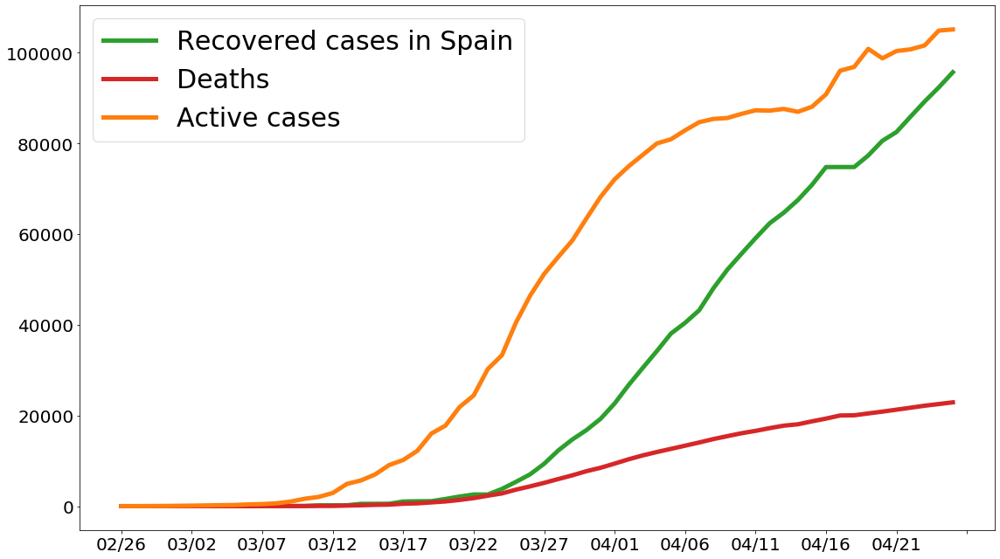

In [475]:
confirm = pd.read_csv('data/JH/confirm_agg.csv').set_index('Country/Region')
death = pd.read_csv('data/JH/death_agg.csv').set_index('Country/Region')
recover = pd.read_csv('data/JH/recover_agg.csv').set_index('Country/Region')
data = {'Confirmed':confirm, 'Death':death, 'Recovered':recover}

fig, ax = plt.subplots(figsize=(16,9))
country = 'Spain'
offset = 35


focus = pd.DataFrame()
focus = focus.append(confirm.T[country][offset:]).append(death.T[country][offset:]).append(recover.T[country][offset:]).T
focus.columns = ['Confirm','Death','Recover']
focus['Active'] = focus['Confirm'] - focus['Death'] - focus['Recover']

focus['time'] = pd.to_datetime(focus.index)
focus.index = focus.time.dt.strftime('%m/%d')
focus.drop('time', axis=1, inplace=True)

ax.plot(focus['Recover'], c='C2', lw=5, label='Recovered cases in '+ country)
ax.plot(focus['Death'], c='C3', lw=5, label='Deaths')
ax.plot(focus['Active'], c='C1', lw=5, label='Active cases')

ax.tick_params(labelsize=20)
ax.legend(loc=2, fontsize=30)


plt.tight_layout()
ax.xaxis.set_major_locator(plt.MaxNLocator(15))
ax.format_xdata = mdates.DateFormatter('%m-%d')

plt.savefig(r'figures/Active_case_%s.png' %(country+date), dpi=600)

# NYT US data

In [476]:
df = pd.read_csv('data/Country detailed/US by state.csv').set_index('date')
df['time'] = pd.to_datetime(df.index)
df.index = df.time.dt.strftime('%m/%d')
df.drop('time', axis=1, inplace=True)

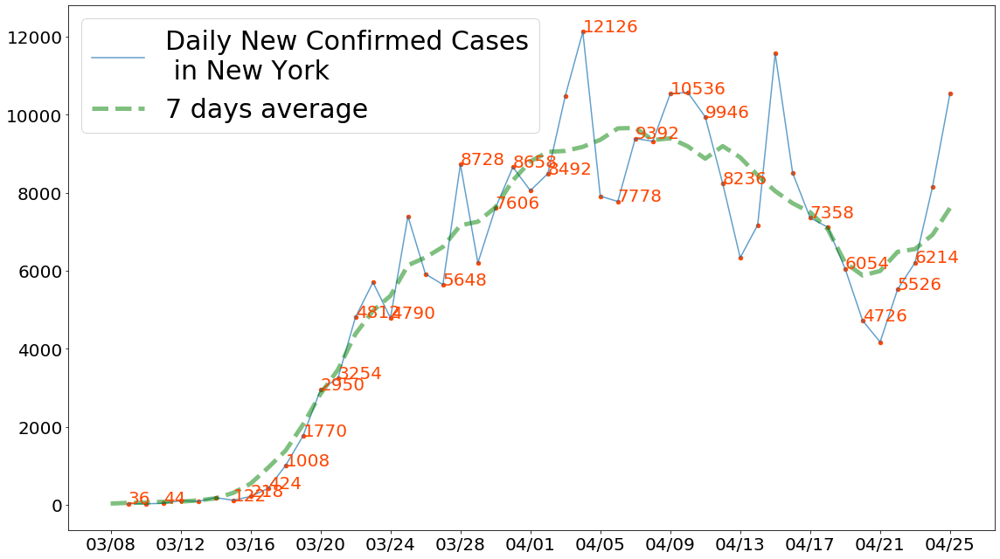

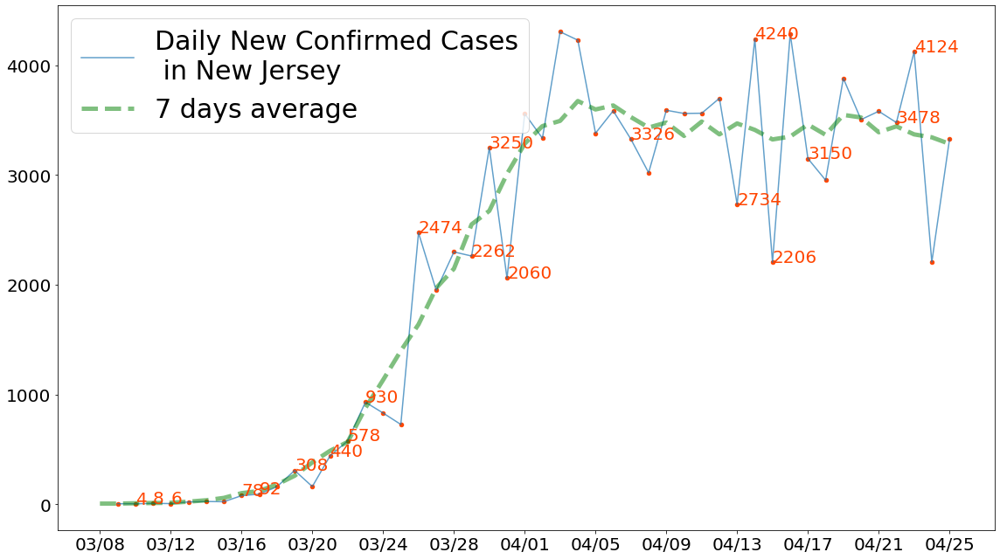

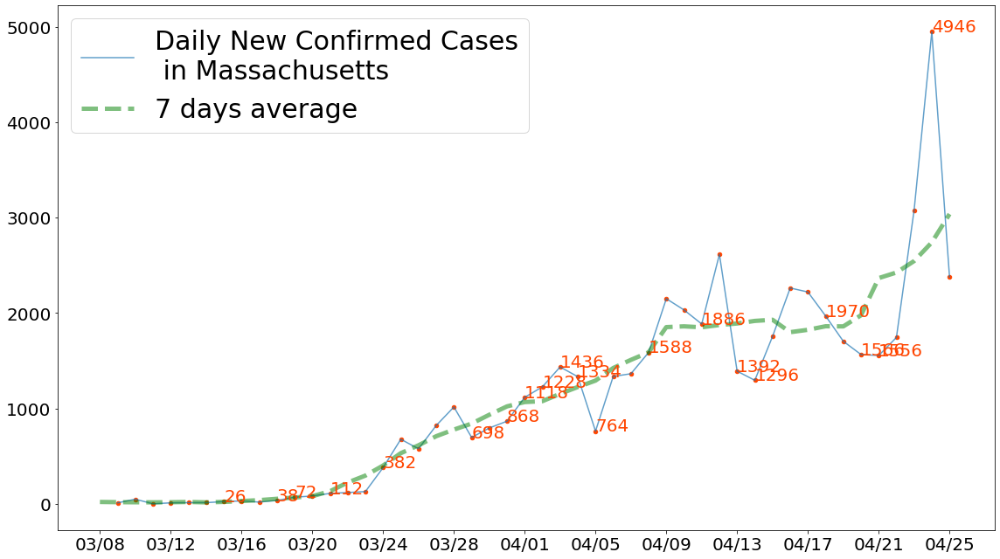

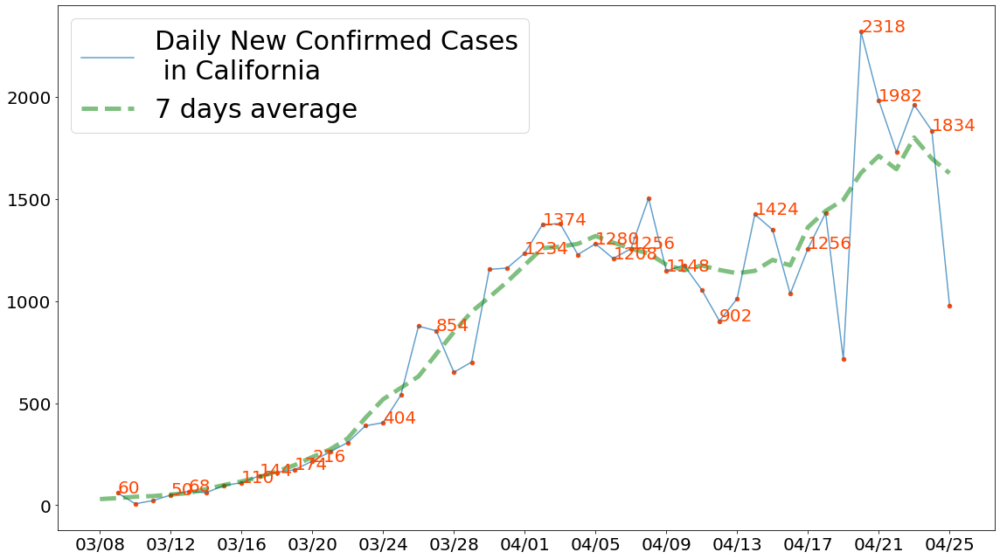

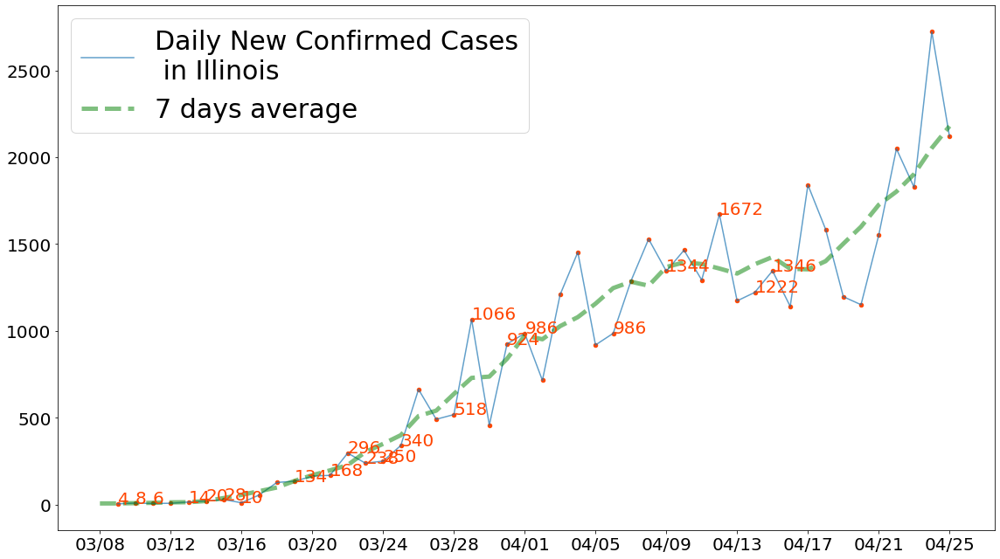

...

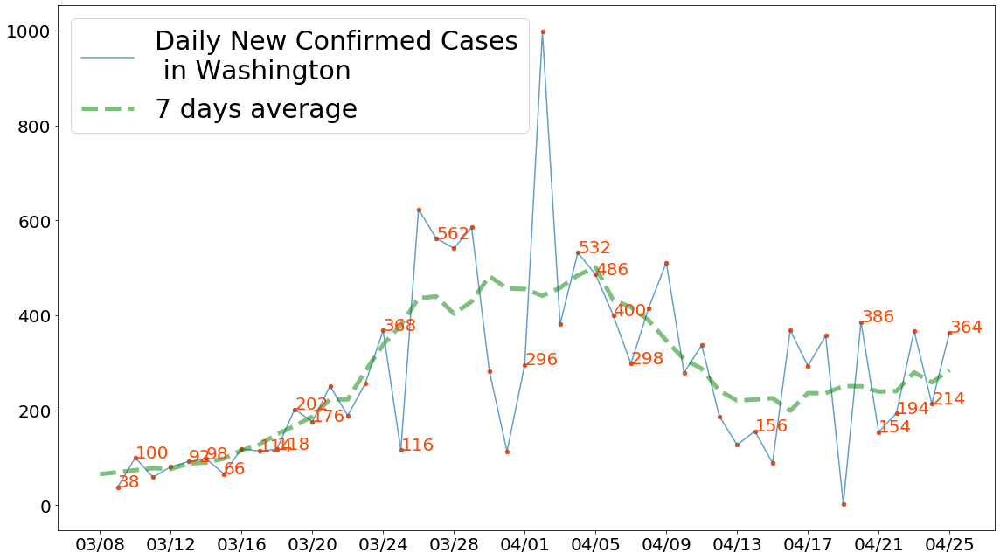

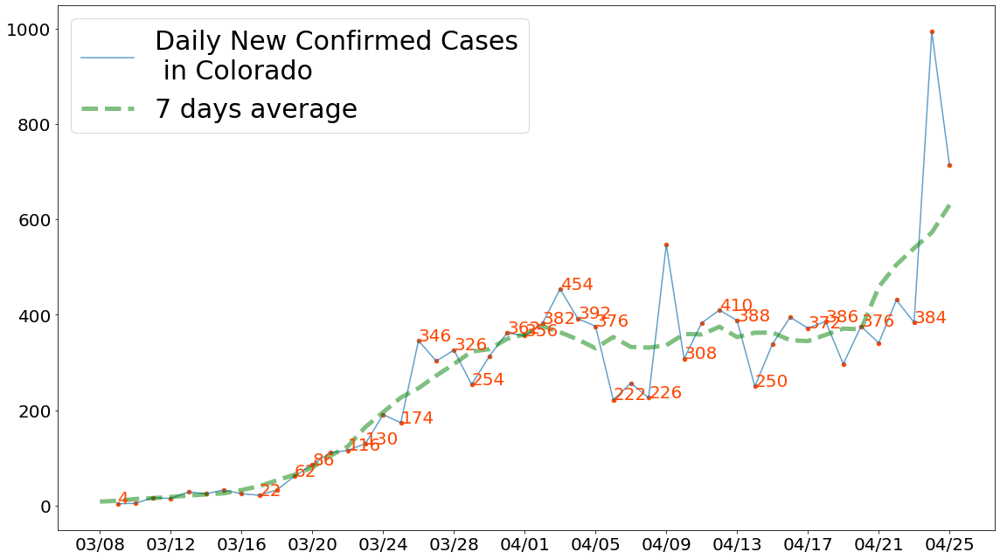

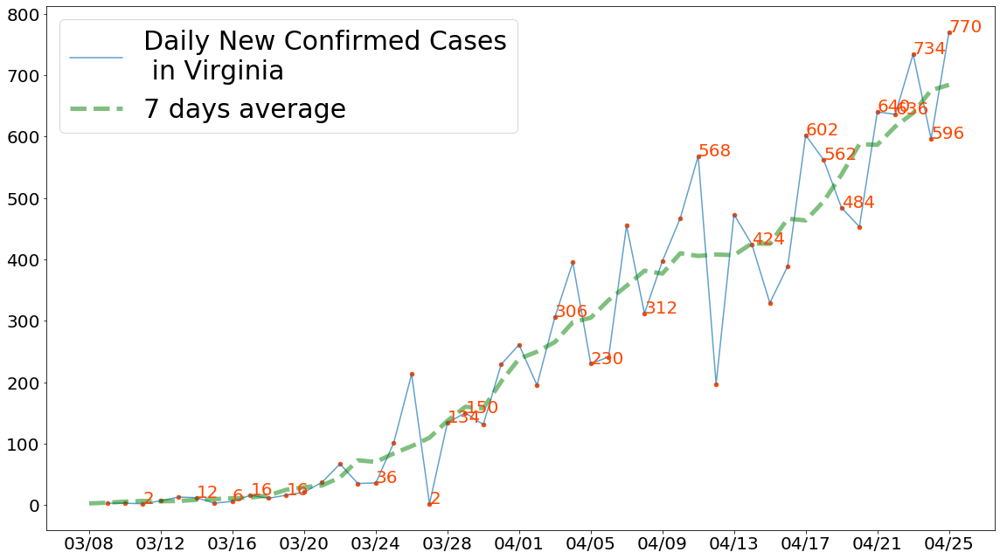

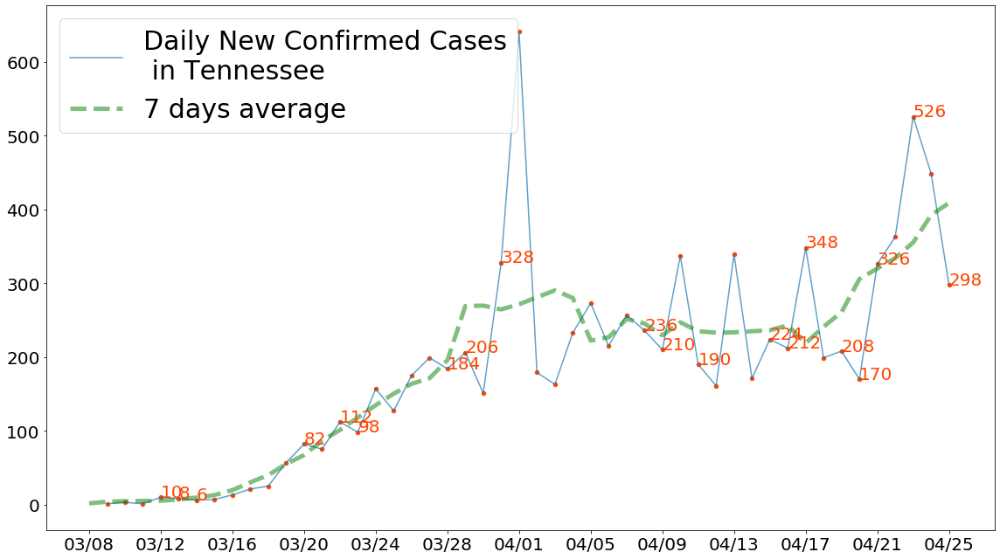

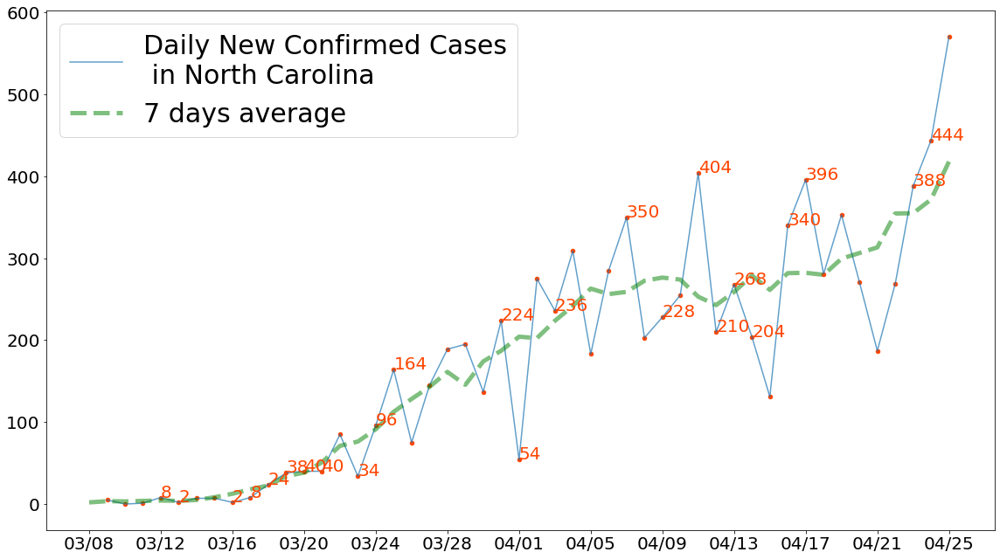

In [477]:
offset = 15
for country in df.iloc[-1].sort_values(ascending=False).index[:20]:

    focus =  df.loc[:,[country]].copy()[offset: ]
    focus['new'] = focus[country] - focus[country].shift(1)

    fig, ax=plt.subplots(nrows=1, ncols=1, figsize=(16,9))
    ax.plot(focus.index, focus.new, label='Daily New Confirmed Cases\n in ' + country, alpha=0.7)
    ax.scatter(focus.index, focus.new, c='orangered',s=20, label='')

    window = 7
    focus['average'] = focus['new'].rolling(window=window, min_periods=1, center=True).mean()
    ax.plot(focus.index, focus.average, 'g--', lw=5, alpha=0.5, label='%d days average'%window)

    for i, v in enumerate(focus.new):
        if v > 0 and v not in [5974,4050,5210,4668,3590,9320, 6549] and v%2==0:
            ax.text(i, v+0.3, str(int(v)), color='orangered', fontsize=20)

    # ax.set_yscale('log')
    ax.tick_params(labelsize=20)
    ax.legend(loc="upper left", fontsize=30)

    plt.tight_layout()
    ax.xaxis.set_major_locator(plt.MaxNLocator(15))
#     plt.show()
#     plt.savefig(r'figures/%s.png'% (country+date), dpi=600)

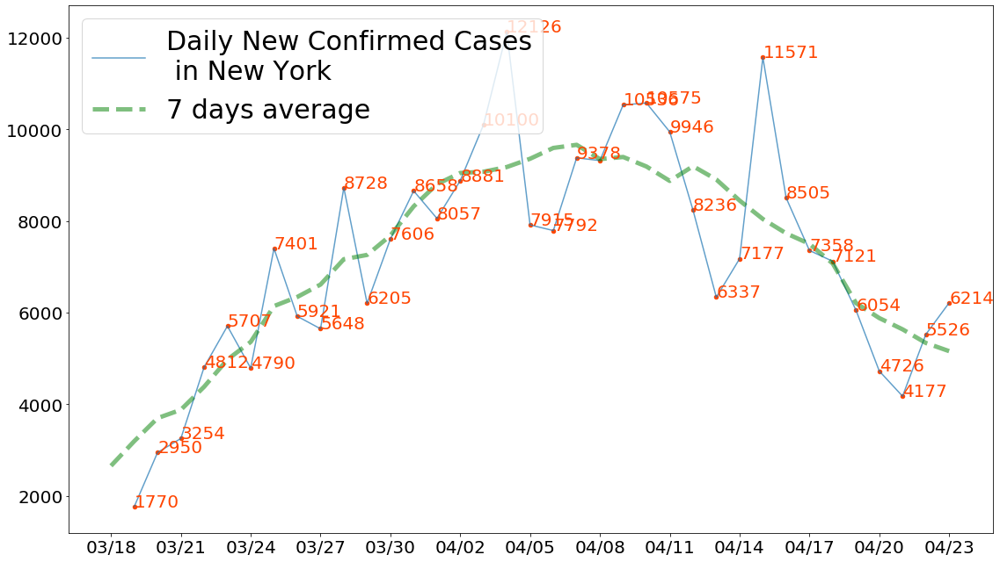

In [415]:
offset = 25
country = 'New York'

focus =  df.loc[:,[country]].copy()[offset: ]
focus['new'] = focus[country] - focus[country].shift(1)

fig, ax=plt.subplots(nrows=1, ncols=1, figsize=(16,9))
ax.plot(focus.index, focus.new, label='Daily New Confirmed Cases\n in ' + country, alpha=0.7)
ax.scatter(focus.index, focus.new, c='orangered',s=20, label='')

window = 7
focus['average'] = focus['new'].rolling(window=window, min_periods=1, center=True).mean()
ax.plot(focus.index, focus.average, 'g--', lw=5, alpha=0.5, label='%d days average'%window)

for i, v in enumerate(focus.new):
    if v > 0 and v not in [5974,4050,5210,4668,3590,9320, 6549,366,259,266]:
        ax.text(i, v+0.3, str(int(v)), color='orangered', fontsize=20)

# ax.set_yscale('log')
ax.tick_params(labelsize=20)
ax.legend(loc="upper left", fontsize=30)

plt.tight_layout()
ax.xaxis.set_major_locator(plt.MaxNLocator(15))
plt.savefig(r'figures/%s.png'% (country+date), dpi=600)

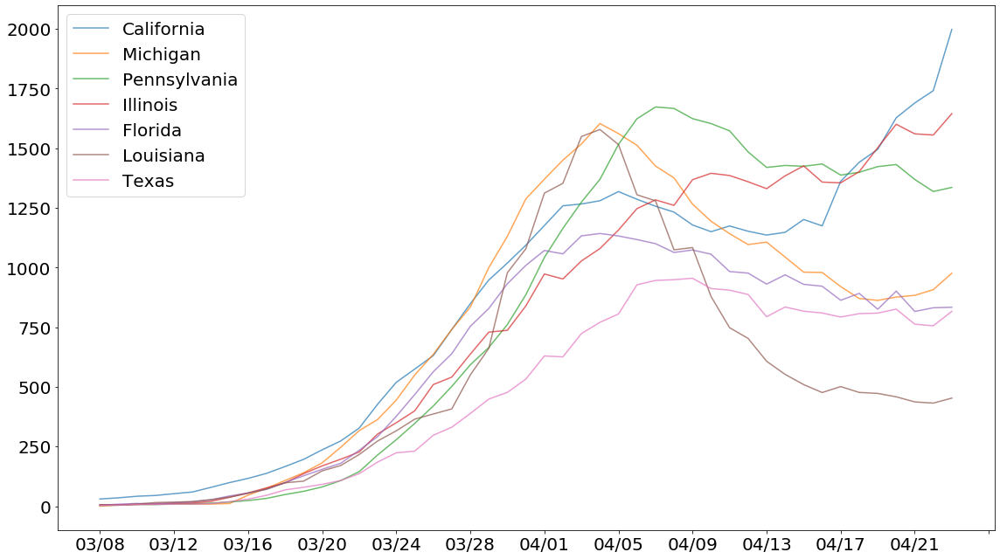

In [334]:
focus = df.copy().iloc[15:]

for i in list(focus):
    focus[i] = focus[i] - focus[i].shift(1)
    focus[i] = focus[i].rolling(window=window, min_periods=1, center=True).mean()


fig, ax=plt.subplots(nrows=1, ncols=1, figsize=(16,9))
for i in list(focus)[3:10]:
    ax.plot(focus.index, focus[i], label=i, alpha=0.7)
# ax.set_yscale('log')
ax.tick_params(labelsize=20)
ax.legend(loc="upper left", fontsize=20)

plt.tight_layout()
ax.xaxis.set_major_locator(plt.MaxNLocator(15))


# COVIDtracking data

In [479]:
with urllib.request.urlopen("https://covidtracking.com/api/v1/states/daily.json") as url:
    data = json.loads(url.read().decode())
df = pd.DataFrame(data)
df['date'] = pd.to_datetime(df.date, format='%Y%m%d')
df.iloc[0]['date']

Timestamp('2020-04-26 00:00:00')

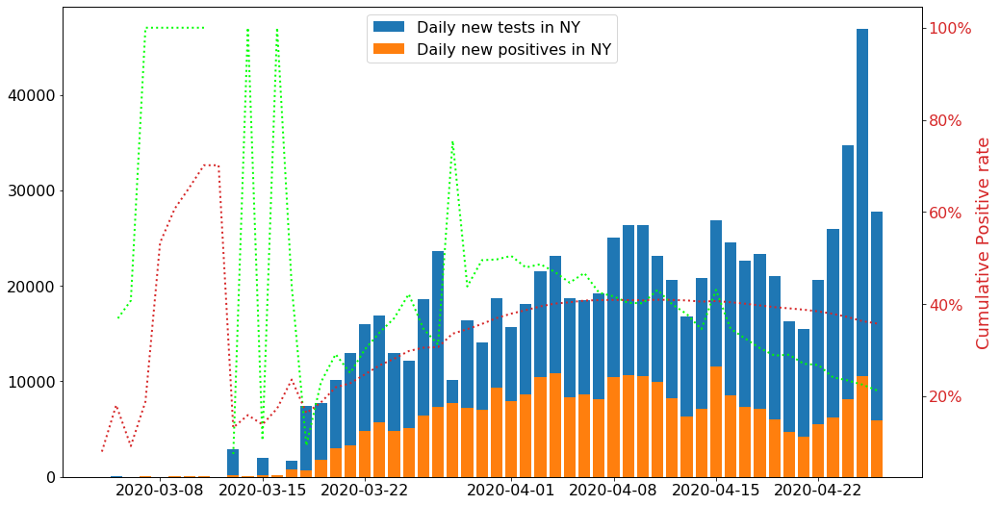

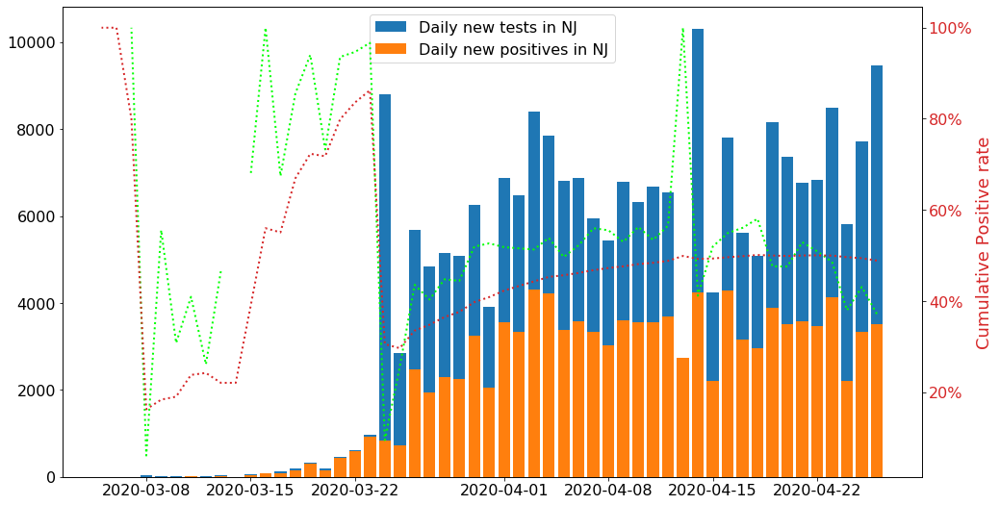

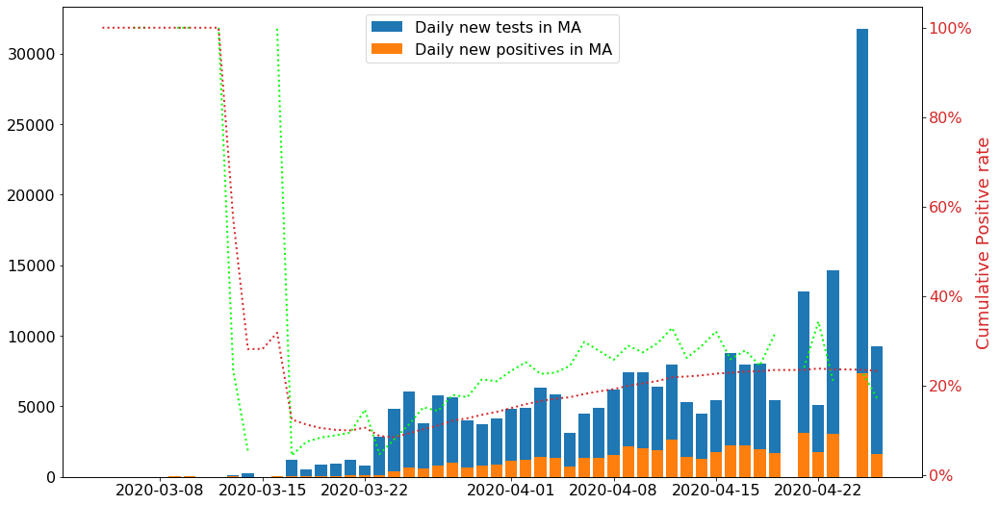

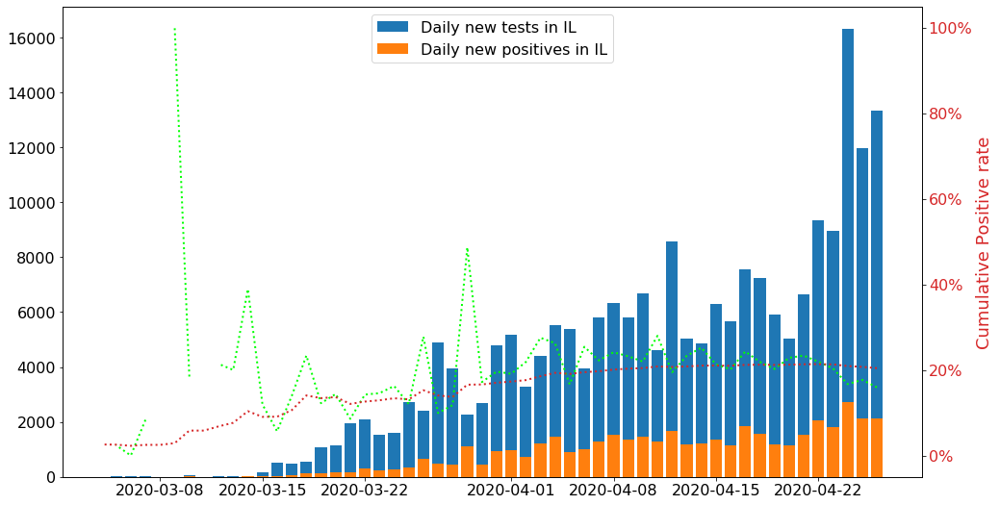

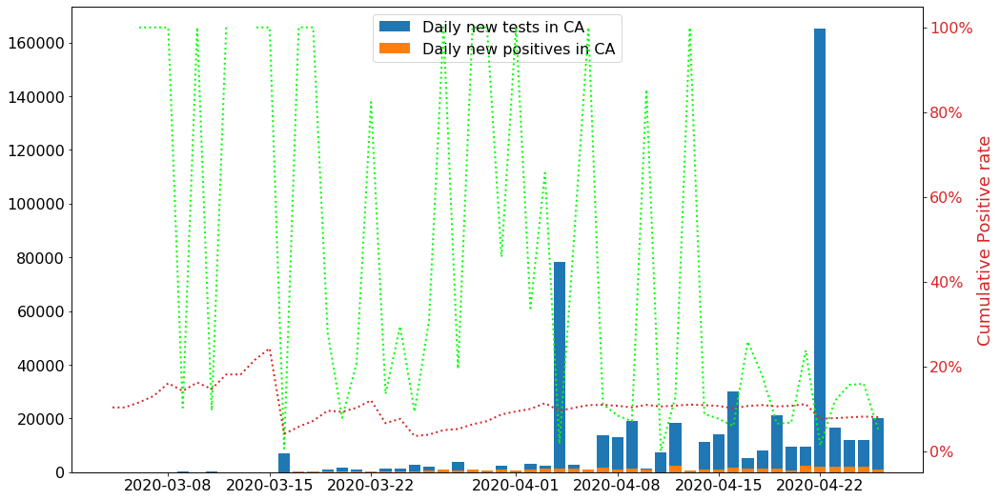

...

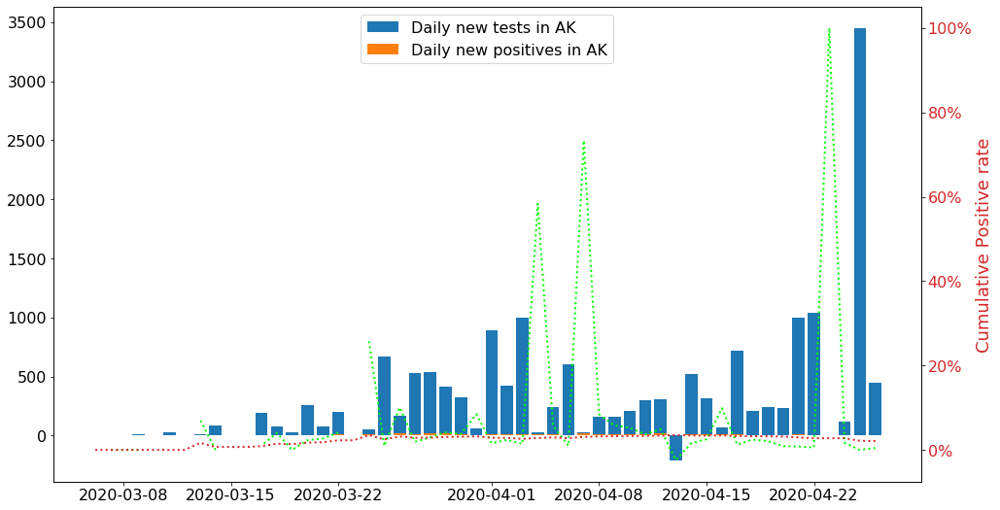

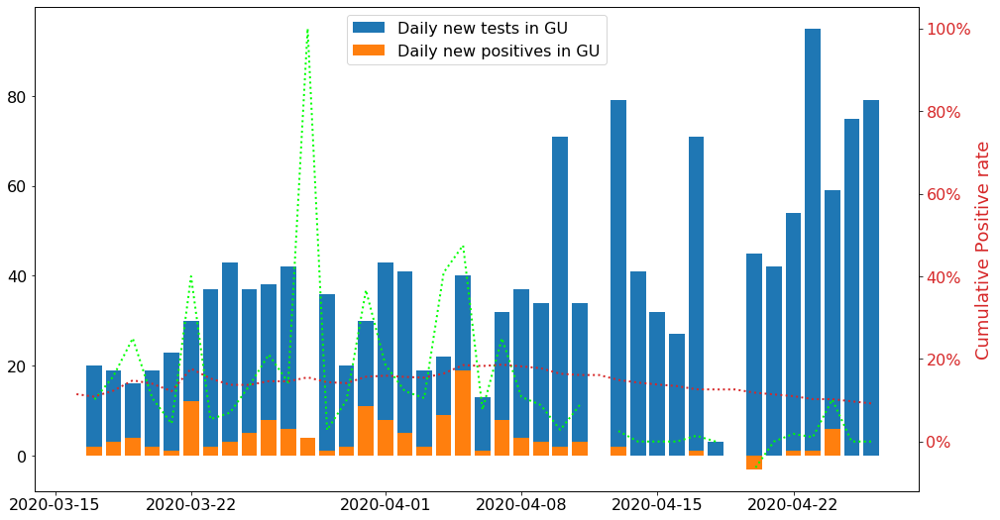

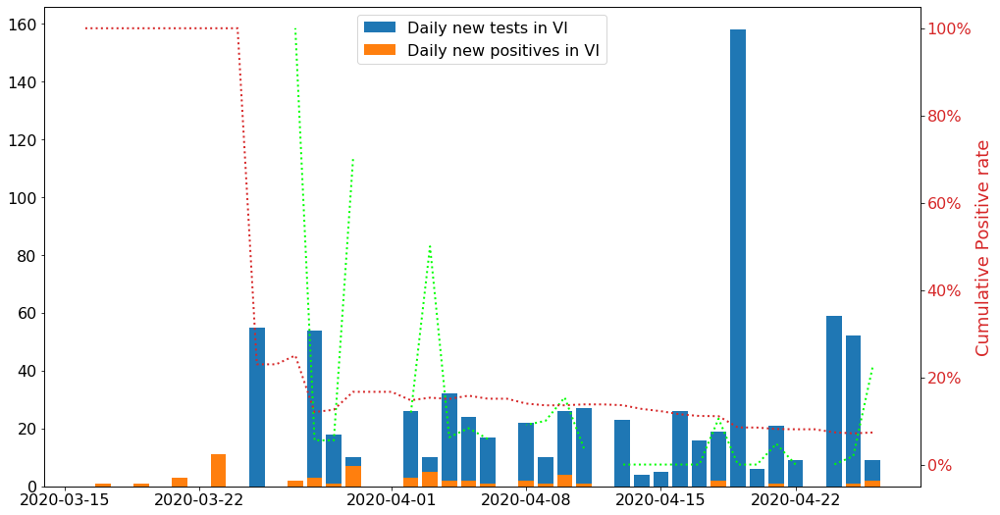

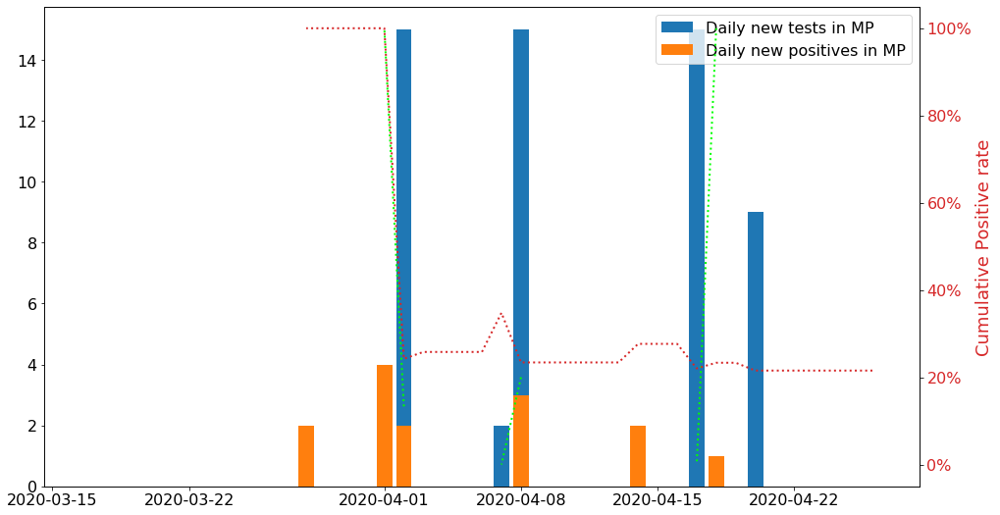

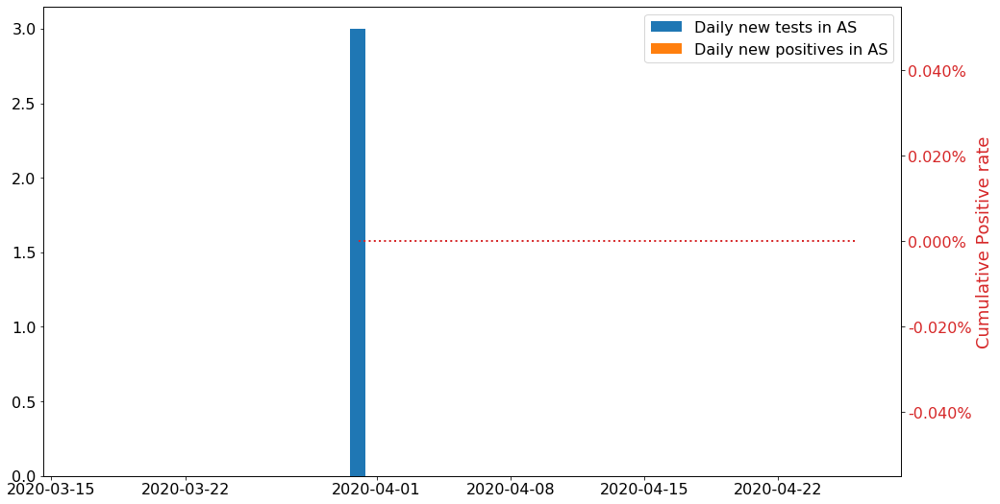

In [481]:
for focus_state in df[df['date']==df['date'][0]].sort_values('positive', ascending=False)['state']:
    focus = df[df['state']==focus_state].drop('state', axis=1)
    focus.index = pd.date_range(end=df['date'][0],periods=len(focus), freq='D')[::-1]

    fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(16,9))

    ax.bar(x=focus.index, height=focus['totalTestResultsIncrease'],label='Daily new tests in '+focus_state)
    ax.bar(x=focus.index, height=focus['positiveIncrease'],label='Daily new positives in '+focus_state)
    ax.legend(fontsize=16)

    ax2 = ax.twinx()
    color = 'tab:red'
    ax2.set_ylabel('Cumulative Positive rate', color=color, fontsize=18)
    ax2.plot(focus['positiveIncrease']/focus['totalTestResultsIncrease']*100, ls=':', lw=2, color='lime')
    ax2.plot(focus['positive']/focus['total']*100, ls=':', lw=2, color=color)
    ax2.tick_params(axis='y', labelcolor=color)
    ax2.yaxis.set_major_formatter(mtick.PercentFormatter())
    ax.tick_params(labelsize=16)
    ax2.tick_params(labelsize=16)
    plt.show()

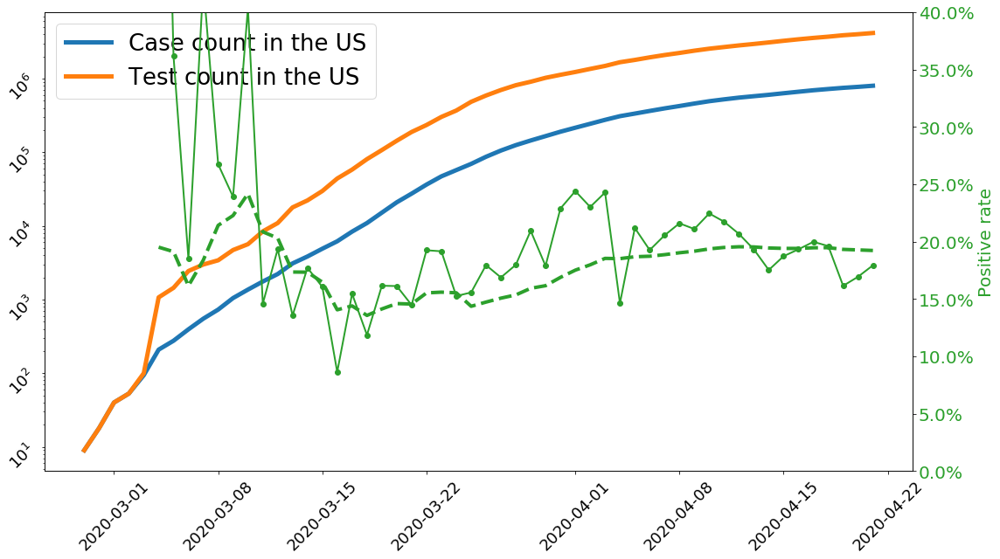

In [169]:
fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(16,9))

focus = df.groupby('date').agg(sum).copy()
focus.index = pd.date_range(end=pd.to_datetime(str(df['date'][0])),periods=len(focus), freq='D')

ax.plot(focus.index, focus['positive'], lw=5, label='Case count in the US')
ax.plot(focus.index, focus['total'], lw=5, label='Test count in the US')
ax.set_yscale('log')
ax.legend(fontsize=26)
# ax.annotate('dfsdf',xy=(5, 500))
plt.tick_params(axis='both', which='major', rotation=45, labelsize=18)

ax2 = ax.twinx()
color = 'tab:green'
ax2.set_ylabel('Positive rate', color=color, fontsize=20)
ax2.plot(focus.index[5:], (focus['positive']/focus['total']*100)[5:], ls='--', lw=4, color=color, label='Cumulative positive rate')
ax2.plot(focus.index[5:], (focus['positiveIncrease']/focus['totalTestResultsIncrease']*100)[5:], 'o-', lw=2, color=color, label='Daily positive rate')
ax2.tick_params(axis='y', labelcolor=color)
ax2.set_ylim(0,40)

plt.tick_params(axis='both', which='major', labelsize=20)
ax2.yaxis.set_major_formatter(mtick.PercentFormatter())

plt.tight_layout()

# plt.savefig('figures/US_pos_rate_4_13.png', dps=600)

# Positive rate dynamics

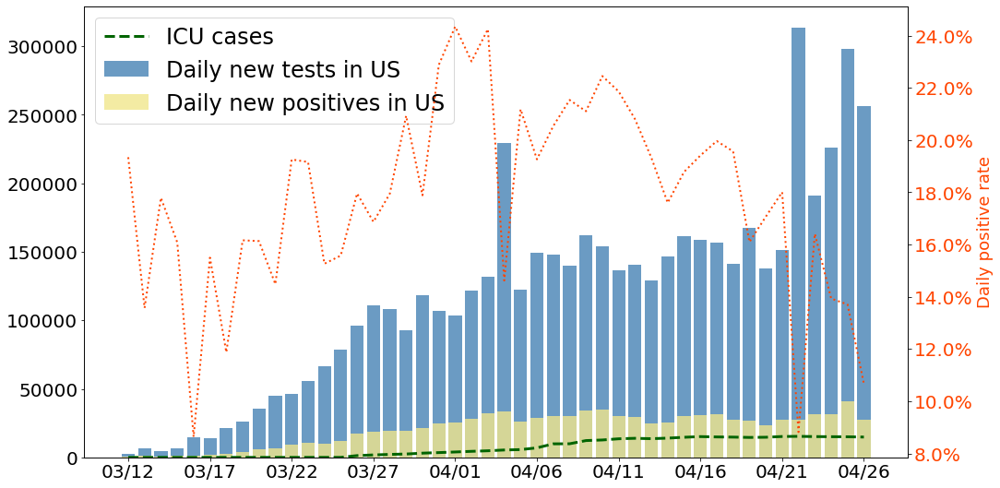

In [505]:
with urllib.request.urlopen("https://covidtracking.com/api/v1/states/daily.json") as url:
    data = json.loads(url.read().decode())
df = pd.DataFrame(data)

focus = df.groupby('date').agg(sum).copy()
focus['time'] = pd.to_datetime(focus.index, format='%Y%m%d')
focus.index = focus.time.dt.strftime('%m/%d')
focus = focus.iloc[50:]

fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(16,9))

ax.bar(x=focus.index, height=focus['totalTestResultsIncrease'],label='Daily new tests in US', color='steelblue', alpha=0.8)
ax.bar(x=focus.index, height=focus['positiveIncrease'],label='Daily new positives in US', color='khaki', alpha=0.8)
ax.plot(focus.index, focus['inIcuCurrently'], ls='--',lw=3, color='darkgreen', label='ICU cases')
ax.legend(fontsize=24)

ax2 = ax.twinx()
color = 'orangered'
ax2.set_ylabel('Daily positive rate', color=color, fontsize=18)
ax2.plot(focus['positiveIncrease']/focus['totalTestResultsIncrease']*100, ls=':', lw=2, color=color)
ax2.tick_params(axis='y', labelcolor=color)
ax2.yaxis.set_major_formatter(mtick.PercentFormatter())
ax.tick_params(labelsize=20)
ax2.tick_params(labelsize=20)
ax.xaxis.set_major_locator(plt.MaxNLocator(12))
plt.savefig(r'figures/Positive_rate_US_%s.png'%date, dps=600)

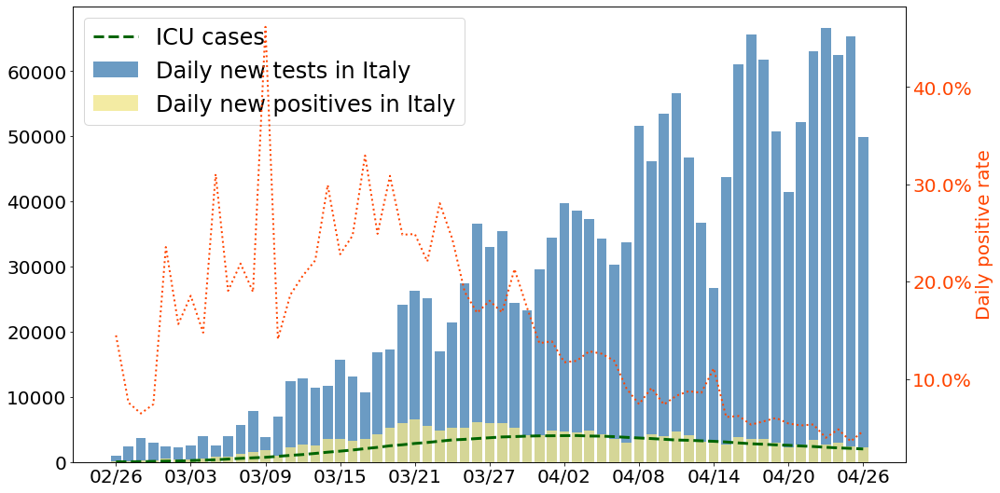

In [498]:
s = '1nhZ0LaPdxgniyJa22MpqgQxUM88AIgSgJagyyA-VjGU'
gid = '&gid=1476893770'
path = 'https://docs.google.com/spreadsheets/d/' + s + '/export?format=csv&id=' + s + gid

df = pd.read_csv(path, skiprows=[1]).set_index(['Italy']).iloc[7:,21:]
focus = df.copy()
fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(16,9))

focus['time'] = pd.to_datetime(focus.index)
focus.index = focus.time.dt.strftime('%m/%d')

ax.bar(x=focus.index, height=focus['New Tested'],label='Daily new tests in Italy', color='steelblue', alpha=0.8)
ax.bar(x=focus.index, height=focus['New Confirmed'],label='Daily new positives in Italy', color='khaki', alpha=0.8)
ax.plot(focus.index, focus['ICU'], ls='--',lw=3, color='darkgreen', label='ICU cases')
ax.legend(loc=0, fontsize=24)

ax2 = ax.twinx()
color = 'orangered'
ax2.set_ylabel('Daily positive rate', color=color, fontsize=20)
ax2.plot(focus['New Confirmed']/focus['New Tested']*100, ls=':', lw=2, color=color, label='Dailay positive rate')
# ax2.legend(fontsize=16)
ax2.tick_params(axis='y', labelcolor=color)
ax2.yaxis.set_major_formatter(mtick.PercentFormatter())
ax.tick_params(labelsize=20)
ax2.tick_params(labelsize=20)
ax.xaxis.set_major_locator(plt.MaxNLocator(12))
plt.savefig(r'figures/Positive_rate_Italy_%s.png'%date, dps=600)

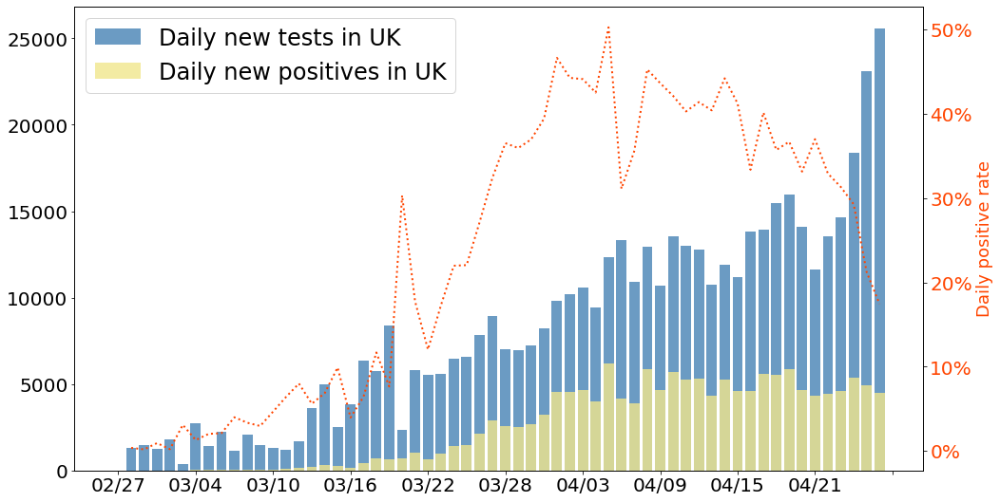

In [499]:
s = '1nhZ0LaPdxgniyJa22MpqgQxUM88AIgSgJagyyA-VjGU'
gid = '&gid=2079214621'
path = 'https://docs.google.com/spreadsheets/d/' + s + '/export?format=csv&id=' + s + gid

df = pd.read_csv(path, skiprows=[1,2,3]).set_index('UK')
focus = df.copy()
fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(16,9))

focus['time'] = pd.to_datetime(focus.index)
focus.index = focus.time.dt.strftime('%m/%d')

ax.bar(x=focus.index, height=focus['New Tested'],label='Daily new tests in UK', color='steelblue', alpha=0.8)
ax.bar(x=focus.index, height=focus['New Confirmed'],label='Daily new positives in UK', color='khaki', alpha=0.8)
# ax.plot(focus.index, focus['ICU'], ls='--',lw=3, color='orangered', label='ICU cases')
ax.legend(loc=2, fontsize=24)

ax2 = ax.twinx()
color = 'orangered'
ax2.set_ylabel('Daily positive rate', color=color, fontsize=18)
ax2.plot(focus['New Confirmed']/focus['New Tested']*100, ls=':', lw=2, color=color, label='Dailay positive rate')
# ax2.legend(fontsize=16)
ax2.tick_params(axis='y', labelcolor=color)
ax2.yaxis.set_major_formatter(mtick.PercentFormatter())
ax.tick_params(labelsize=20)
ax2.tick_params(labelsize=20)
ax.xaxis.set_major_locator(plt.MaxNLocator(12))
plt.savefig(r'figures/Positive_rate_UK_%s.png'%date, dps=600)

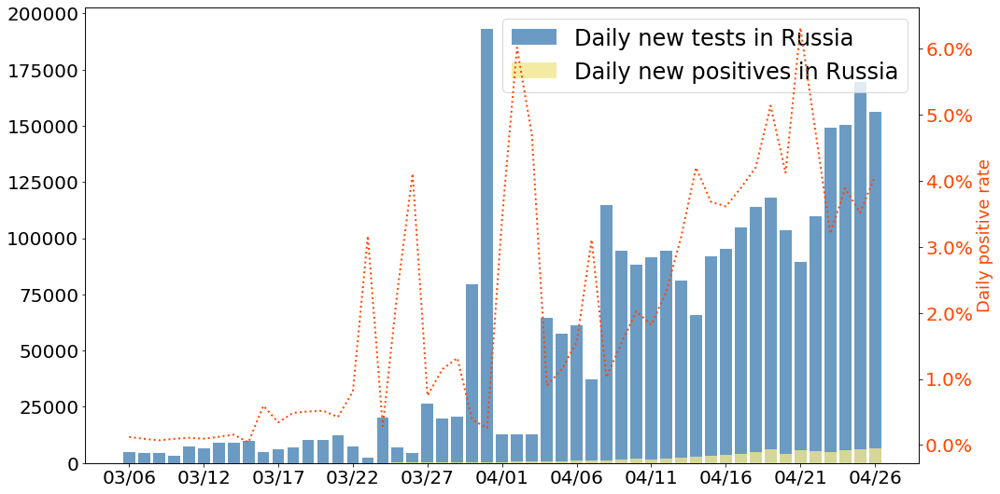

In [500]:
s = '1nhZ0LaPdxgniyJa22MpqgQxUM88AIgSgJagyyA-VjGU'
gid = '&gid=1386561607'
path = 'https://docs.google.com/spreadsheets/d/' + s + '/export?format=csv&id=' + s + gid

df = pd.read_csv(path, skiprows=[1,2,3,4]).set_index('Russia')
focus = df.copy().dropna(subset=['pos rate'])
focus['time'] = pd.to_datetime(focus.index)
focus.index = focus.time.dt.strftime('%m/%d')
focus = focus.iloc[:,-10:]

fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(16,9))

ax.bar(x=focus.index, height=focus['new test'],label='Daily new tests in Russia', color='steelblue', alpha=0.8)
ax.bar(x=focus.index, height=focus['New case'],label='Daily new positives in Russia', color='khaki', alpha=0.8)

ax.legend(fontsize=24)

ax2 = ax.twinx()
color = 'orangered'
ax2.set_ylabel('Daily positive rate', color=color, fontsize=18)
ax2.plot(focus['New case']/focus['new test']*100, ls=':', lw=2, color=color)
ax2.tick_params(axis='y', labelcolor=color)
ax2.yaxis.set_major_formatter(mtick.PercentFormatter())
ax.tick_params(labelsize=20)
ax2.tick_params(labelsize=20)
ax.xaxis.set_major_locator(plt.MaxNLocator(12))
plt.savefig(r'figures/Positive_rate_Russia_%s.png'%date, dps=600)

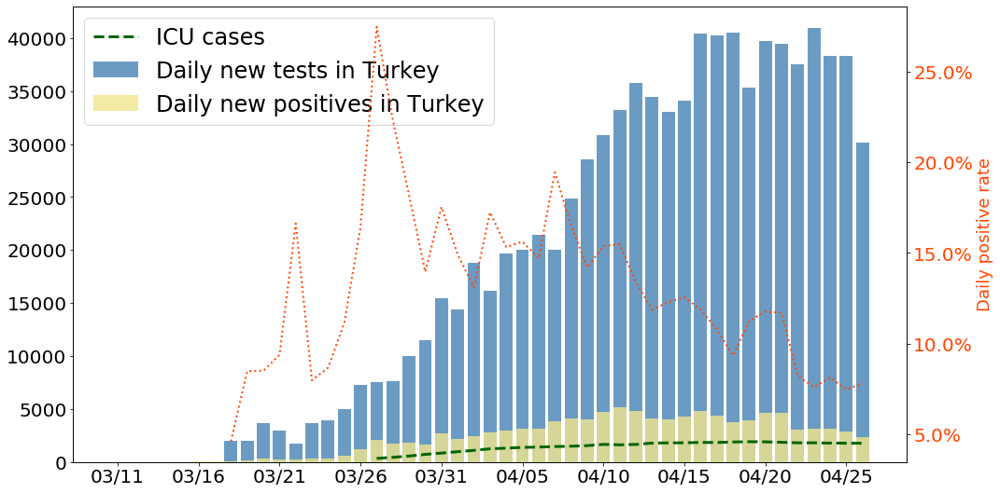

In [501]:
s = '1nhZ0LaPdxgniyJa22MpqgQxUM88AIgSgJagyyA-VjGU'
gid = '&gid=2019967562'
path = 'https://docs.google.com/spreadsheets/d/' + s + '/export?format=csv&id=' + s + gid

df = pd.read_csv(path, skiprows=[1]).set_index('Turkey')
focus = df.copy()
fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(16,9))

focus['time'] = pd.to_datetime(focus.index)
focus.index = focus.time.dt.strftime('%m/%d')

ax.bar(x=focus.index, height=focus['New Tested'],label='Daily new tests in Turkey', color='steelblue', alpha=0.8)
ax.bar(x=focus.index, height=focus['New Confirmed'],label='Daily new positives in Turkey', color='khaki', alpha=0.8)
ax.plot(focus.index, focus['ICU'], ls='--',lw=3, color='darkgreen', label='ICU cases')
ax.legend(loc=2, fontsize=24)

ax2 = ax.twinx()
color = 'orangered'
ax2.set_ylabel('Daily positive rate', color=color, fontsize=18)
ax2.plot(focus['New Confirmed']/focus['New Tested']*100, ls=':', lw=2, color=color, label='Dailay positive rate')
# ax2.legend(fontsize=16)
ax2.tick_params(axis='y', labelcolor=color)
ax2.yaxis.set_major_formatter(mtick.PercentFormatter())
ax.tick_params(labelsize=20)
ax2.tick_params(labelsize=20)
ax.xaxis.set_major_locator(plt.MaxNLocator(12))
plt.savefig(r'figures/Positive_rate_Turkey_%s.png'%date, dps=600)

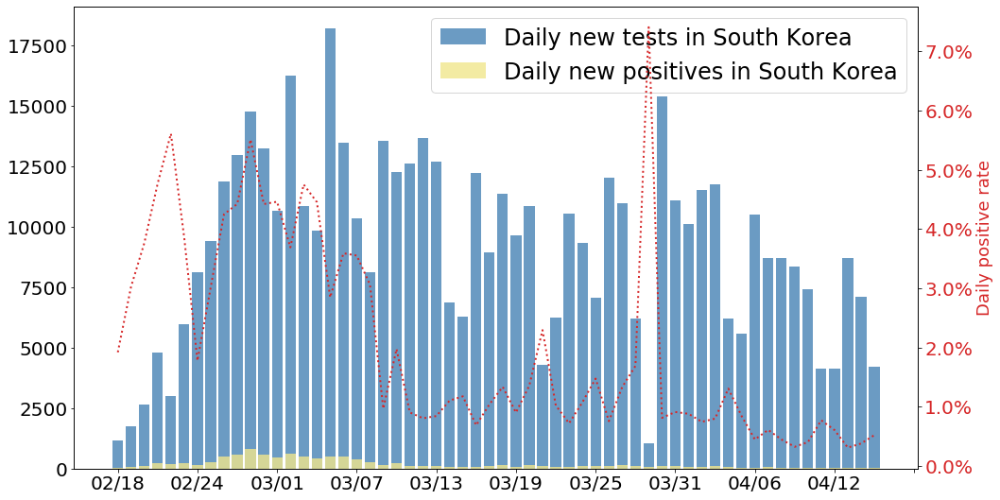

In [190]:
s = '1nhZ0LaPdxgniyJa22MpqgQxUM88AIgSgJagyyA-VjGU'
gid = '&gid=349991176'
path = 'https://docs.google.com/spreadsheets/d/' + s + '/export?format=csv&id=' + s + gid

df = pd.read_csv(path, skiprows=[1]).set_index('South \nKorea')
focus = df.copy()
focus['time'] = pd.to_datetime(focus.index)
focus.index = focus.time.dt.strftime('%m/%d')
focus = focus.iloc[30:,-6:]

fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(16,9))

ax.bar(x=focus.index, height=focus['daily test'],label='Daily new tests in South Korea', color='steelblue', alpha=0.8)
ax.bar(x=focus.index, height=focus['New daily'],label='Daily new positives in South Korea', color='khaki', alpha=0.8)
ax.legend(fontsize=24)

ax2 = ax.twinx()
color = 'tab:red'
ax2.set_ylabel('Daily positive rate', color=color, fontsize=18)
ax2.plot(focus['New daily']/focus['daily test']*100, ls=':', lw=2, color=color)
ax2.tick_params(axis='y', labelcolor=color)
ax2.yaxis.set_major_formatter(mtick.PercentFormatter())
ax.tick_params(labelsize=20)
ax2.tick_params(labelsize=20)
ax.xaxis.set_major_locator(plt.MaxNLocator(12))
# plt.savefig(r'figures/Positive_rate_dynamics_South Korea_%s.png'%date, dps=600)

# Relative fire map

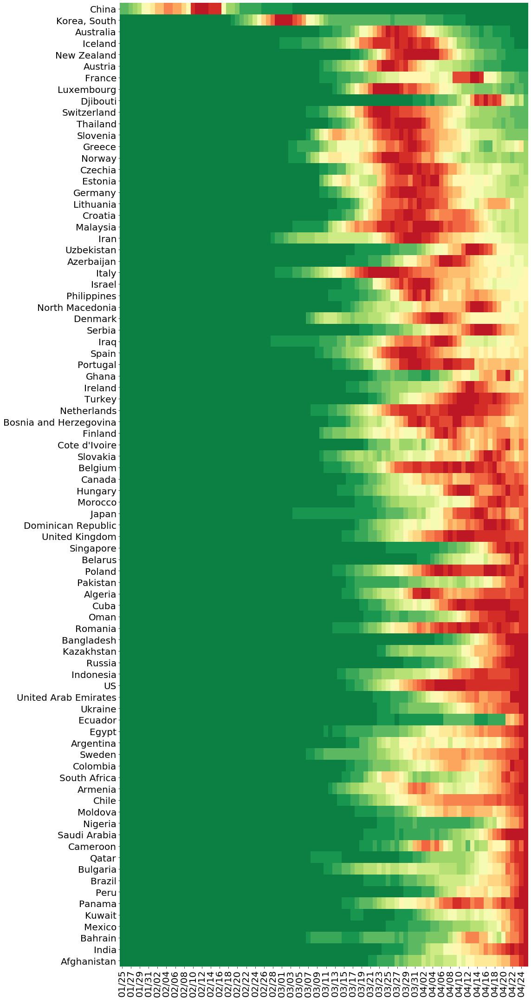

In [502]:
df = pd.read_csv('data/JH/daily_new_case.csv').set_index('Unnamed: 0')
df = df.T[df.sum()>1000].T
df['time'] = pd.to_datetime(df.index)
df.index = df.time.dt.strftime('%m/%d')
df.drop('time', axis=1, inplace=True)

mean = df.copy()
for i in list(df):
    mean[i] = df[i].rolling(window=7, min_periods=1, center=True).mean()    
    
fig, ax=plt.subplots(figsize=(16,30))
cmap=sns.color_palette('RdYlGn_r', 20)
sns.heatmap((mean/mean.max()).T.iloc[:,3:].sort_values(df.index[-1]),
           vmin=0, vmax=1, cmap=cmap, cbar=False)

ax.set_xlabel('')
ax.set_ylabel('')
ax.tick_params(labelsize=20)
plt.tight_layout()
plt.savefig(r'figures/Relative_fire_world_%s.png'%date,dpi=600)

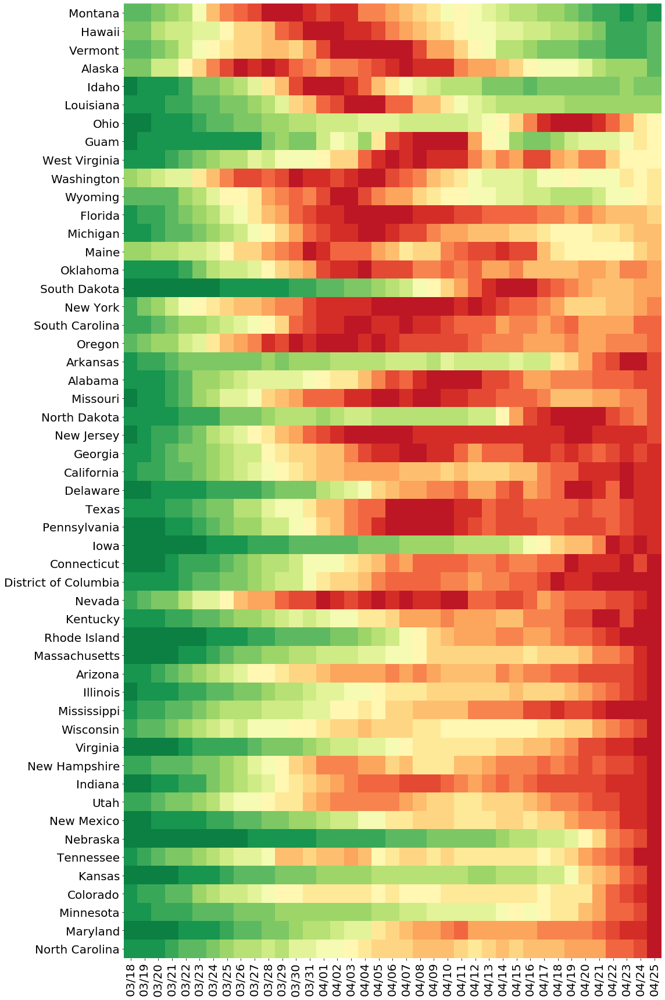

In [503]:
df = pd.read_csv('https://raw.githubusercontent.com/nytimes/covid-19-data/master/us-states.csv')
df = df.pivot(index='date',columns='state',values='cases').iloc[32:]
df = df[df.iloc[-1].sort_values(ascending=False).index]
for i in list(df):
    df[i] = df[i] - df[i].shift(1)
    
df.index.rename('US', inplace=True)
df['time'] = pd.to_datetime(df.index)
df.index = df.time.dt.strftime('%m/%d')
df.drop('time', axis=1, inplace=True)

mean = df.copy()

for i in list(df):
    mean[i] = df[i].rolling(window=7, min_periods=1, center=True).mean()    
    
fig, ax=plt.subplots(figsize=(16,24))
cmap=sns.color_palette('RdYlGn_r', 20)
sns.heatmap((mean/mean.max()).T.iloc[:,25:].sort_values(df.index[-1]).drop(['Northern Mariana Islands','Puerto Rico','Virgin Islands']),
           vmin=0, vmax=1, cmap=cmap, cbar=False)

ax.set_xlabel('')
ax.set_ylabel('')
ax.tick_params(labelsize=20)
plt.tight_layout()
plt.savefig(r'figures/Relative_fire_US_%s.png'%date,dpi=600)